## Zindi Data Science Nigeria 2021 AI Bootcamp Qualification Hackathon

### Author: Dolamu Oludare

<img src = 'Flyer.png'>

## 1. Problem Description
<p style = 'text-align:justify;'> Sapa.com is one of the leading eCommerce platforms in Nigeria with millions of daily complete transactions. The goods and services on sapa.com cater for both the elite and the masses which makes it the first choice for almost everybody in Nigeria. Due to the COVID-19 pandemic that struck the entire world in all areas of living, the companies' daily complete transactions have dropped drastically to thousands.</p>
<p style = 'text-align:justify;'>The CEO, Mr Echoke in his recent actions to put the platform back to the top of the eCommerce platforms chain in the country has approved the use of Artificial intelligence in User Personality Analysis. The company has contracted your team consisting of AI professionals with a special focus on recommender system development to build a robust intelligent model capable of recommending products and services to Users based on their activities on sapa.com.</p>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from datetime import datetime
#from pandas_profiling import ProfileReport
from sklearn.model_selection import KFold,StratifiedKFold,GridSearchCV,RandomizedSearchCV,train_test_split #For splitting
import warnings
warnings.filterwarnings('ignore')

In [3]:
train = pd.read_csv('Train.csv')
test = pd.read_csv('Test.csv')
train.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,22-06-2014,56,2,...,6,20,3,0,0,0,0,0,0,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,01-08-2013,17,6,...,15,19,6,0,0,0,0,0,0,0
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,21-11-2013,17,0,...,18,37,2,0,0,0,1,0,0,1
3,ID_FQVZHE81,1979,2n Cycle,Single,46311.6,1,0,13-09-2013,49,3,...,24,24,8,0,0,0,0,0,0,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,21-01-2014,59,1,...,165,203,1,0,0,0,1,0,0,0


In [4]:
train.shape

(1568, 27)

In [5]:
train['Response'].value_counts()

0    1329
1     239
Name: Response, dtype: int64

In [6]:
print(f'The train dataset consist of {train.shape[0]} rows and {train.shape[1]} columns')

The train dataset consist of 1568 rows and 27 columns


In [7]:
print(f'The features are {train.columns}')

The features are Index(['ID', 'Year_of_Birth', 'Education_Level', 'Marital_Status',
       'Disposable_Income', 'No_of_Kids_in_home', 'No_of_Teen_in_home',
       'Date_Customer', 'Recency', 'Discounted_Purchases', 'WebPurchases',
       'CatalogPurchases', 'StorePurchases', 'Amount_on_Wines',
       'Amount_on_Fruits', 'Amount_on_MeatProducts', 'Amount_on_FishProducts',
       'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth',
       'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted',
       'Cmp2Accepted', 'Any_Complain', 'Response'],
      dtype='object')


Let's Identify the target variable using a simple list comprehension

In [8]:
target = [target for target in train.columns if target not in test.columns]
for a in target:
    print(f'Our target Variable is {a}')

Our target Variable is Response


### Study of relevances of Features in the dataset

#### Variable definations

- **ID**: Unique identifier for each User

- **Year_of_Birth**: Year of birth

- **Education_Level**: The highest level of education attained by the User

- **Marital_Status**: Marital status

- **Disposable_Income**: Yearly User’s household disposable income

- **No_of_Kids_in_home**: total count of children in the user’s home

- **No_of_Teen_in_home**: Number of teenagers in the User's household

- **Date_Customer**: Date of User's enrollment with the company

- **Recency**: Number of days since User's last purchase

- **Discounted_Purchases**: Counts of purchases made by the user using coupons

- **WebPurchases**: Counts of purchases made by the user through the company’s website

- **CatalogPurchases**: Counts of purchases made by the user using a catalogue

- **StorePurchases**: Counts of purchases made by the user directly in stores

- **Amount_on_Wines**: Total amount user spent on wine and drinks within the last 3 years

- **Amount_on_Fruits**: Total amount user spent on fruity food within the last 3 years

- **Amount_on_MeatProducts**: Total amount user spent on meat products and livestock within the last 3 years

- **Amount_on_FishProducts**: Total amount user spent on fish alone within the last 3 years

- **Amount_on_SweetProducts**: Total amount user spent on sweets and chocolates within the last 3 years

- **Amount_on_GoldProds**: Total amount user spent on golden products within the last 3 years

- **WebVisitsMonth**: The number of times the user of visits to company’s website within the last 4 weeks

- **Cmp3Accepted**: 1: Offer was accepted after the third campaign, 0 otherwise

- **Cmp4Accepted**: 1: Offer was accepted after the fourth campaign, 0 otherwise

- **Cmp5Accepted**: 1: Offer was accepted after the fifth campaign, 0 otherwise

- **Cmp1Accepted**: 1: Offer was accepted after the first campaign, 0 otherwise

- **Cmp2Accepted**: 1: Offer was accepted after the second campaign, 0 otherwise

- **Any_Complain**: 1 if the user has a compliant history with the platform in the last 3 years, 0 otherwise

- **User_Response**: 1: indicates the acceptance of offer and 0 otherwise


## 2. Quick Feature Exploration on Data

In [ ]:
profile = ProfileReport(train, title="Pandas Profiling Report")
profile

## 3. Checking for Correlation

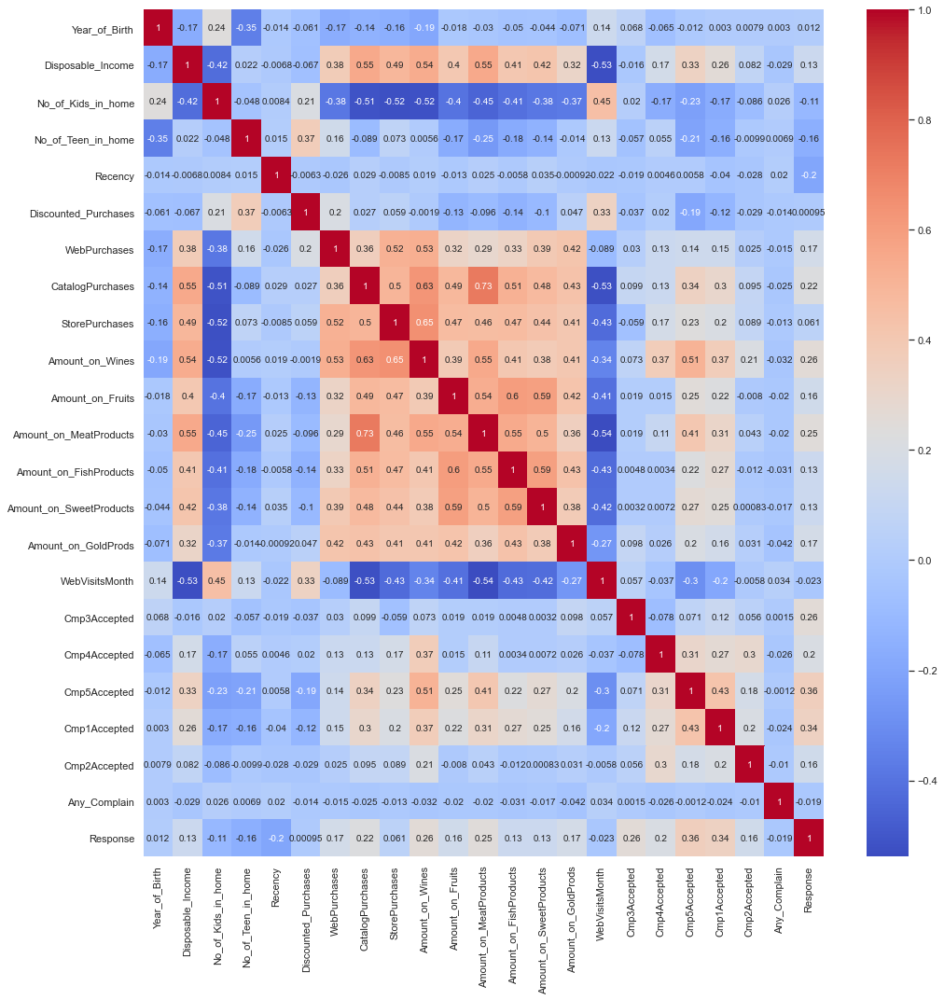

In [111]:
plt.figure(figsize = (15,15), tight_layout = True)
sns.heatmap(train.corr(), annot = True, cmap = 'coolwarm');

In [9]:
train.corr()

,Year_of_Birth,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
Year_of_Birth,1.000000,-0.169006,0.242429,-0.353991,-0.014155,-0.061246,-0.165289,-0.140005,-0.159045,-0.191037,...,-0.044336,-0.071109,0.135795,0.067942,-0.065205,-0.012450,0.002963,0.007885,0.002978,0.012279
Disposable_Income,-0.169006,1.000000,-0.420914,0.021720,-0.006822,-0.066990,0.380671,0.553196,0.490041,0.541937,...,0.418429,0.320388,-0.530072,-0.016061,0.169711,0.333425,0.259968,0.082295,-0.029043,0.130254
No_of_Kids_in_home,0.242429,-0.420914,1.000000,-0.048091,0.008404,0.211293,-0.384441,-0.508997,-0.521173,-0.519091,...,-0.384115,-0.372180,0.450402,0.020496,-0.165929,-0.225912,-0.170760,-0.086368,0.026223,-0.108558
No_of_Teen_in_home,-0.353991,0.021720,-0.048091,1.000000,0.014712,0.373262,0.155173,-0.088757,0.073129,0.005626,...,-0.140542,-0.013651,0.125594,-0.057385,0.055496,-0.209937,-0.158758,-0.009915,0.006894,-0.156209
Recency,-0.014155,-0.006822,0.008404,0.014712,1.000000,-0.006311,-0.026068,0.029136,-0.008498,0.019051,...,0.034841,-0.000920,-0.022179,-0.018657,0.004643,0.005828,-0.040377,-0.028077,0.020208,-0.201654
Discounted_Purchases,-0.061246,-0.066990,0.211293,0.373262,-0.006311,1.000000,0.204052,0.026556,0.058702,-0.001913,...,-0.102849,0.046953,0.333250,-0.037245,0.019819,-0.191230,-0.121472,-0.028915,-0.013818,0.000951
WebPurchases,-0.165289,0.380671,-0.384441,0.155173,-0.026068,0.204052,1.000000,0.361998,0.518604,0.530179,...,0.394216,0.419859,-0.088528,0.029988,0.128313,0.142003,0.145100,0.024543,-0.015261,0.165538
CatalogPurchases,-0.140005,0.553196,-0.508997,-0.088757,0.029136,0.026556,0.361998,1.000000,0.497271,0.630364,...,0.476969,0.429251,-0.525378,0.098568,0.126016,0.340899,0.297788,0.094675,-0.024632,0.221534
StorePurchases,-0.159045,0.490041,-0.521173,0.073129,-0.008498,0.058702,0.518604,0.497271,1.000000,0.647018,...,0.440027,0.407657,-0.426029,-0.058922,0.172418,0.233461,0.202406,0.088803,-0.013259,0.061446
Amount_on_Wines,-0.191037,0.541937,-0.519091,0.005626,0.019051,-0.001913,0.530179,0.630364,0.647018,1.000000,...,0.383789,0.405581,-0.338141,0.073176,0.374574,0.509900,0.371342,0.207473,-0.031781,0.259173


There is really no correlation between our target variable and predictor variables

## 4. Checking the data types and Information.

In [10]:
train.dtypes

ID                          object
Year_of_Birth                int64
Education_Level             object
Marital_Status              object
Disposable_Income          float64
No_of_Kids_in_home           int64
No_of_Teen_in_home           int64
Date_Customer               object
Recency                      int64
Discounted_Purchases         int64
WebPurchases                 int64
CatalogPurchases             int64
StorePurchases               int64
Amount_on_Wines              int64
Amount_on_Fruits             int64
Amount_on_MeatProducts       int64
Amount_on_FishProducts       int64
Amount_on_SweetProducts      int64
Amount_on_GoldProds          int64
WebVisitsMonth               int64
Cmp3Accepted                 int64
Cmp4Accepted                 int64
Cmp5Accepted                 int64
Cmp1Accepted                 int64
Cmp2Accepted                 int64
Any_Complain                 int64
Response                     int64
dtype: object

## 5. Data Cleaning

<AxesSubplot:>

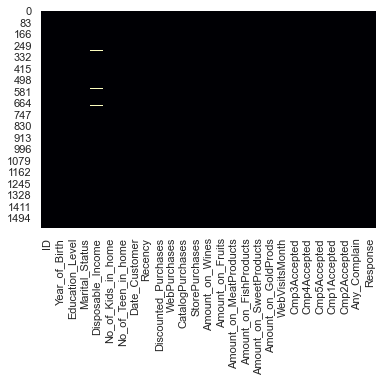

In [135]:
sns.heatmap(train.isnull(), cbar = False, cmap = 'magma')

In [11]:
train.isnull().sum()

ID                          0
Year_of_Birth               0
Education_Level             0
Marital_Status              0
Disposable_Income          16
No_of_Kids_in_home          0
No_of_Teen_in_home          0
Date_Customer               0
Recency                     0
Discounted_Purchases        0
WebPurchases                0
CatalogPurchases            0
StorePurchases              0
Amount_on_Wines             0
Amount_on_Fruits            0
Amount_on_MeatProducts      0
Amount_on_FishProducts      0
Amount_on_SweetProducts     0
Amount_on_GoldProds         0
WebVisitsMonth              0
Cmp3Accepted                0
Cmp4Accepted                0
Cmp5Accepted                0
Cmp1Accepted                0
Cmp2Accepted                0
Any_Complain                0
Response                    0
dtype: int64

In [12]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1568 entries, 0 to 1567
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       1568 non-null   object 
 1   Year_of_Birth            1568 non-null   int64  
 2   Education_Level          1568 non-null   object 
 3   Marital_Status           1568 non-null   object 
 4   Disposable_Income        1552 non-null   float64
 5   No_of_Kids_in_home       1568 non-null   int64  
 6   No_of_Teen_in_home       1568 non-null   int64  
 7   Date_Customer            1568 non-null   object 
 8   Recency                  1568 non-null   int64  
 9   Discounted_Purchases     1568 non-null   int64  
 10  WebPurchases             1568 non-null   int64  
 11  CatalogPurchases         1568 non-null   int64  
 12  StorePurchases           1568 non-null   int64  
 13  Amount_on_Wines          1568 non-null   int64  
 14  Amount_on_Fruits        

In [13]:
abs(train.corr().iloc[:,1].sort_values())

WebVisitsMonth             0.530072
No_of_Kids_in_home         0.420914
Year_of_Birth              0.169006
Discounted_Purchases       0.066990
Any_Complain               0.029043
Cmp3Accepted               0.016061
Recency                    0.006822
No_of_Teen_in_home         0.021720
Cmp2Accepted               0.082295
Response                   0.130254
Cmp4Accepted               0.169711
Cmp1Accepted               0.259968
Amount_on_GoldProds        0.320388
Cmp5Accepted               0.333425
WebPurchases               0.380671
Amount_on_Fruits           0.400659
Amount_on_FishProducts     0.409130
Amount_on_SweetProducts    0.418429
StorePurchases             0.490041
Amount_on_Wines            0.541937
CatalogPurchases           0.553196
Amount_on_MeatProducts     0.554645
Disposable_Income          1.000000
Name: Disposable_Income, dtype: float64

## Mini linear regression to fill missing values

In [14]:
from sklearn.linear_model import LinearRegression

Lr  = LinearRegression()

#setting our predictor variables
to_train = ['Disposable_Income','CatalogPurchases','Amount_on_Wines','Amount_on_MeatProducts','WebVisitsMonth']
train_df = train[to_train]


#splitting the data
x_train = train_df[train_df['Disposable_Income'].notnull()].drop(columns = 'Disposable_Income')
y_train = train_df[train_df['Disposable_Income'].notnull()]['Disposable_Income']
x_test = train_df[train_df['Disposable_Income'].isnull()].drop(columns = 'Disposable_Income')


Lr.fit(x_train,y_train)
pred = Lr.predict(x_test)

print(np.round(pred,1))     

[ 77871.1  66818.2 105503.3  46024.2  95676.7  41671.7  68487.6  51119.4
  42379.3  64553.3  88619.2  40864.   68554.8  46373.5  94957.3  46194.7]


In [15]:
train['Disposable_Income'][train['Disposable_Income'].isnull()] = pred

In [16]:
train.isnull().sum()

ID                         0
Year_of_Birth              0
Education_Level            0
Marital_Status             0
Disposable_Income          0
No_of_Kids_in_home         0
No_of_Teen_in_home         0
Date_Customer              0
Recency                    0
Discounted_Purchases       0
WebPurchases               0
CatalogPurchases           0
StorePurchases             0
Amount_on_Wines            0
Amount_on_Fruits           0
Amount_on_MeatProducts     0
Amount_on_FishProducts     0
Amount_on_SweetProducts    0
Amount_on_GoldProds        0
WebVisitsMonth             0
Cmp3Accepted               0
Cmp4Accepted               0
Cmp5Accepted               0
Cmp1Accepted               0
Cmp2Accepted               0
Any_Complain               0
Response                   0
dtype: int64

In [17]:
train.duplicated().sum()

0

<AxesSubplot:>

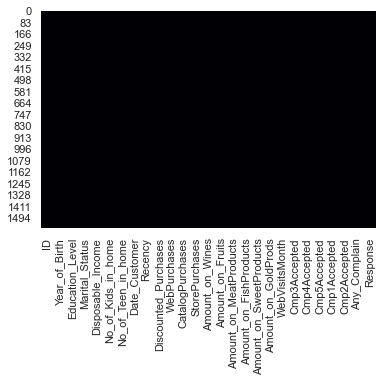

In [143]:
sns.heatmap(train.isnull(), cbar = False, cmap = 'magma')

In [18]:
train.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,22-06-2014,56,2,...,6,20,3,0,0,0,0,0,0,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,01-08-2013,17,6,...,15,19,6,0,0,0,0,0,0,0
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,21-11-2013,17,0,...,18,37,2,0,0,0,1,0,0,1
3,ID_FQVZHE81,1979,2n Cycle,Single,46311.6,1,0,13-09-2013,49,3,...,24,24,8,0,0,0,0,0,0,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,21-01-2014,59,1,...,165,203,1,0,0,0,1,0,0,0


In [19]:
train['Education_Level'].replace('2n Cycle', 'Secondary', inplace=True)

In [20]:
for i in train.columns:
    print(train[i].value_counts())

ID_47DJ22ST    1
ID_D16J9O5O    1
ID_OI56Q47B    1
ID_VUU06713    1
ID_KTIY1ZIL    1
              ..
ID_HEQSBKG9    1
ID_37HAB2HS    1
ID_95DXFRBE    1
ID_SPN18120    1
ID_ESQ8WKSS    1
Name: ID, Length: 1568, dtype: int64
1977    70
1972    65
1973    58
1971    57
1966    57
1979    56
1976    55
1970    55
1974    50
1975    46
1967    40
1953    40
1959    39
1956    37
1980    37
1960    34
1957    33
1978    32
1969    32
1983    32
1982    32
1968    31
1955    31
1964    31
1958    28
1987    27
1962    27
1981    26
1963    26
1961    26
1984    26
1985    26
1952    24
1986    24
1954    23
1950    22
1951    22
1989    22
1990    21
1988    19
1965    19
1949    17
1991    16
1948    14
1992    12
1947    11
1993     9
1946     8
1944     6
1996     5
1994     4
1995     3
1945     2
1942     1
1997     1
1900     1
Name: Year_of_Birth, dtype: int64
Graduation    802
PhD           340
Master        246
Secondary     142
Basic          38
Name: Education_Level, dtype: int64


In [21]:
train.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,22-06-2014,56,2,...,6,20,3,0,0,0,0,0,0,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,01-08-2013,17,6,...,15,19,6,0,0,0,0,0,0,0
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,21-11-2013,17,0,...,18,37,2,0,0,0,1,0,0,1
3,ID_FQVZHE81,1979,Secondary,Single,46311.6,1,0,13-09-2013,49,3,...,24,24,8,0,0,0,0,0,0,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,21-01-2014,59,1,...,165,203,1,0,0,0,1,0,0,0


In [22]:
train.dtypes

ID                          object
Year_of_Birth                int64
Education_Level             object
Marital_Status              object
Disposable_Income          float64
No_of_Kids_in_home           int64
No_of_Teen_in_home           int64
Date_Customer               object
Recency                      int64
Discounted_Purchases         int64
WebPurchases                 int64
CatalogPurchases             int64
StorePurchases               int64
Amount_on_Wines              int64
Amount_on_Fruits             int64
Amount_on_MeatProducts       int64
Amount_on_FishProducts       int64
Amount_on_SweetProducts      int64
Amount_on_GoldProds          int64
WebVisitsMonth               int64
Cmp3Accepted                 int64
Cmp4Accepted                 int64
Cmp5Accepted                 int64
Cmp1Accepted                 int64
Cmp2Accepted                 int64
Any_Complain                 int64
Response                     int64
dtype: object

In [23]:
scas = {0: 'No', 1:'Yes'}
train['Any_Complain'] = train['Any_Complain'].map(scas)
train['Cmp3Accepted'] = train['Cmp3Accepted'].map(scas)
train['Cmp1Accepted'] = train['Cmp1Accepted'].map(scas)
train['Cmp2Accepted'] = train['Cmp2Accepted'].map(scas)
train['Cmp4Accepted'] = train['Cmp4Accepted'].map(scas)
train['Cmp5Accepted'] = train['Cmp5Accepted'].map(scas)

In [24]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1568 entries, 0 to 1567
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       1568 non-null   object 
 1   Year_of_Birth            1568 non-null   int64  
 2   Education_Level          1568 non-null   object 
 3   Marital_Status           1568 non-null   object 
 4   Disposable_Income        1568 non-null   float64
 5   No_of_Kids_in_home       1568 non-null   int64  
 6   No_of_Teen_in_home       1568 non-null   int64  
 7   Date_Customer            1568 non-null   object 
 8   Recency                  1568 non-null   int64  
 9   Discounted_Purchases     1568 non-null   int64  
 10  WebPurchases             1568 non-null   int64  
 11  CatalogPurchases         1568 non-null   int64  
 12  StorePurchases           1568 non-null   int64  
 13  Amount_on_Wines          1568 non-null   int64  
 14  Amount_on_Fruits        

In [25]:
train.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,22-06-2014,56,2,...,6,20,3,No,No,No,No,No,No,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,01-08-2013,17,6,...,15,19,6,No,No,No,No,No,No,0
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,21-11-2013,17,0,...,18,37,2,No,No,No,Yes,No,No,1
3,ID_FQVZHE81,1979,Secondary,Single,46311.6,1,0,13-09-2013,49,3,...,24,24,8,No,No,No,No,No,No,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,21-01-2014,59,1,...,165,203,1,No,No,No,Yes,No,No,0


## Exploratory Data Analysis

In [26]:
train['WebVisitsMonth'].unique()

array([ 3,  6,  2,  8,  1,  5,  7,  4, 20,  9,  0, 19, 10, 17, 14, 13],
      dtype=int64)

In [27]:
train['No_of_Kids_in_home'].unique()

array([1, 0, 2], dtype=int64)

In [28]:
train['No_of_Teen_in_home'].unique()

array([1, 0, 2], dtype=int64)

In [29]:
import warnings
warnings.filterwarnings('ignore')

C:\Users\Hp\anaconda3\lib\site-packages\seaborn\axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


<Figure size 432x288 with 0 Axes>

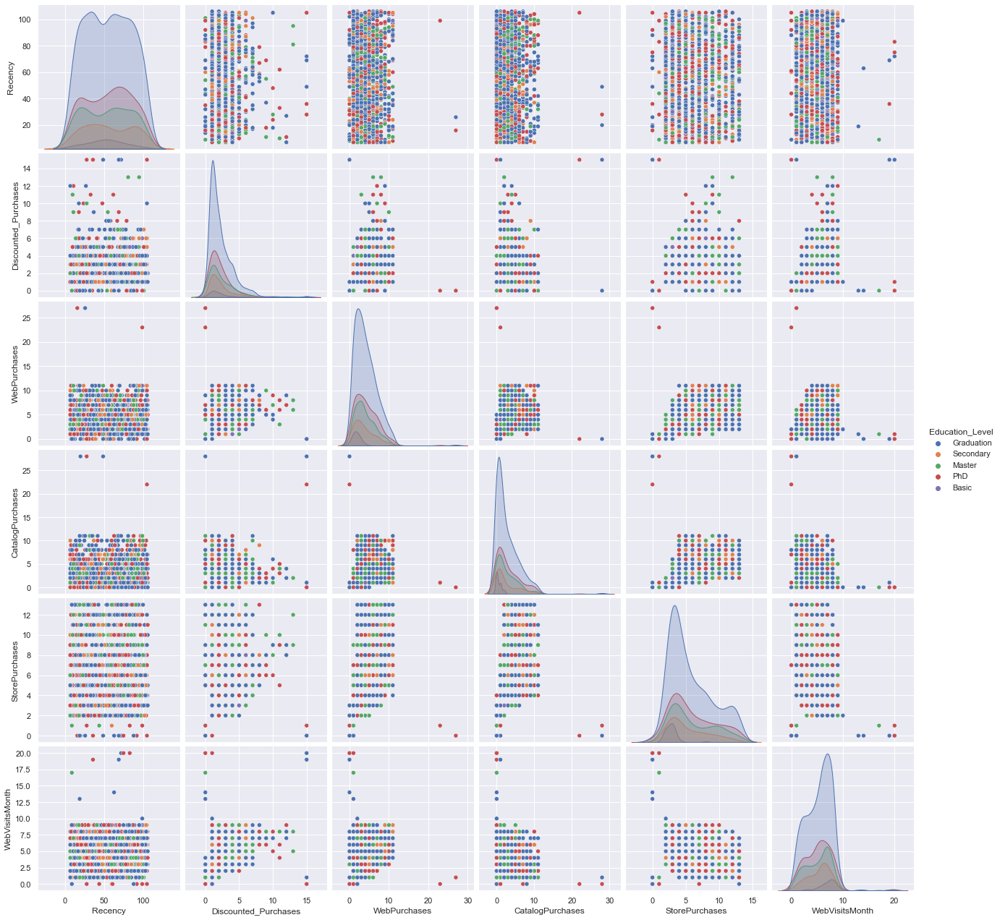

C:\Users\Hp\anaconda3\lib\site-packages\seaborn\axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\Hp\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Hp\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Hp\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Hp\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Hp\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  war

<Figure size 432x288 with 0 Axes>

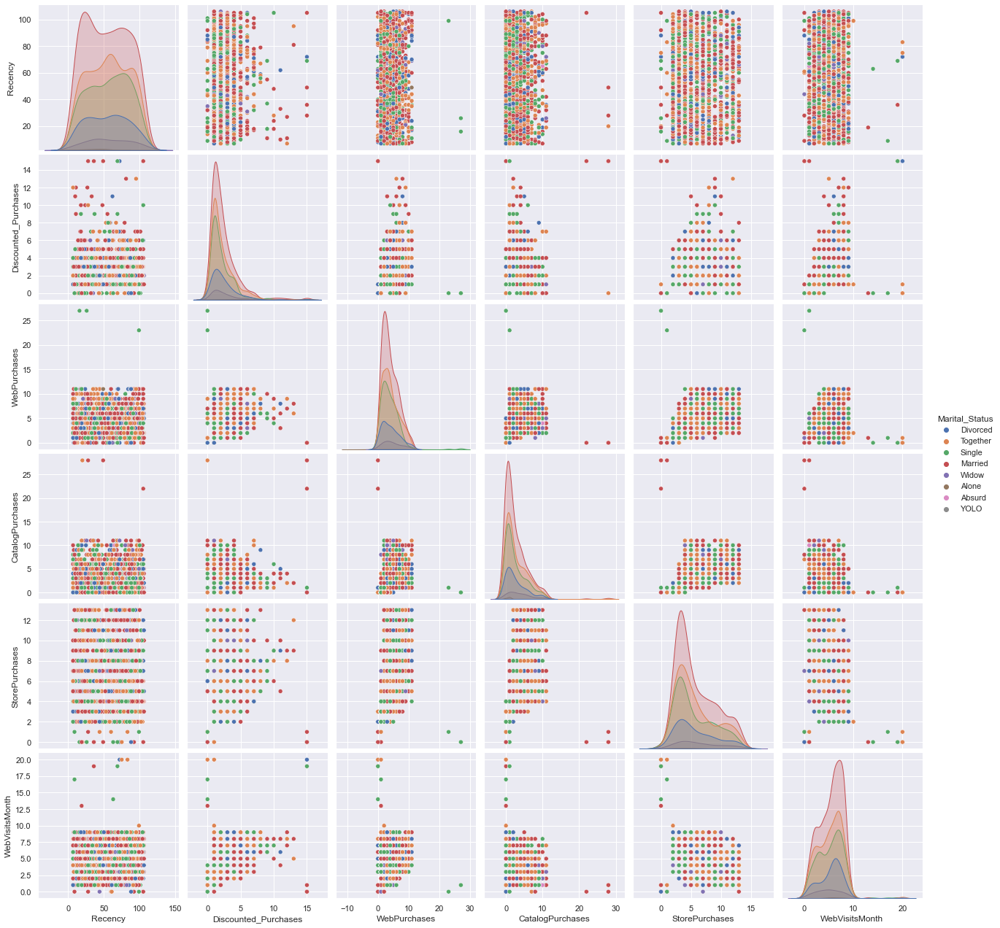

C:\Users\Hp\anaconda3\lib\site-packages\seaborn\axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


<Figure size 432x288 with 0 Axes>

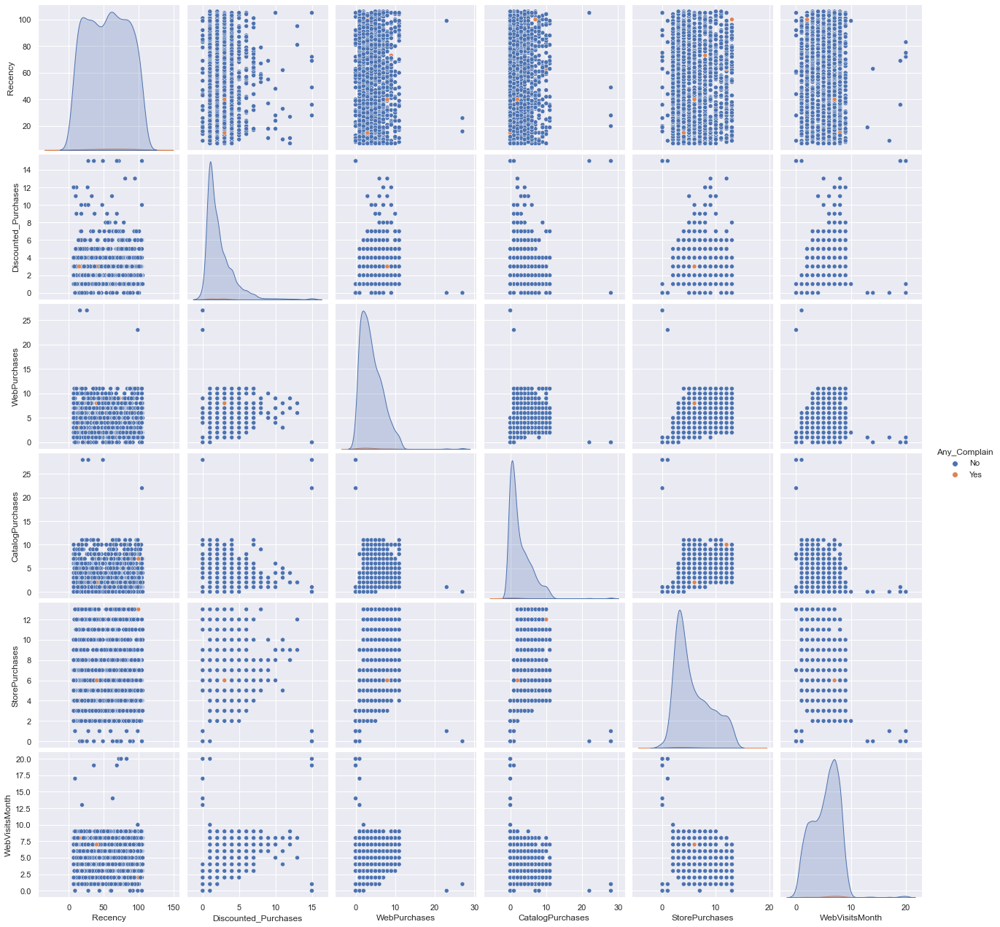

C:\Users\Hp\anaconda3\lib\site-packages\seaborn\axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


<Figure size 432x288 with 0 Axes>

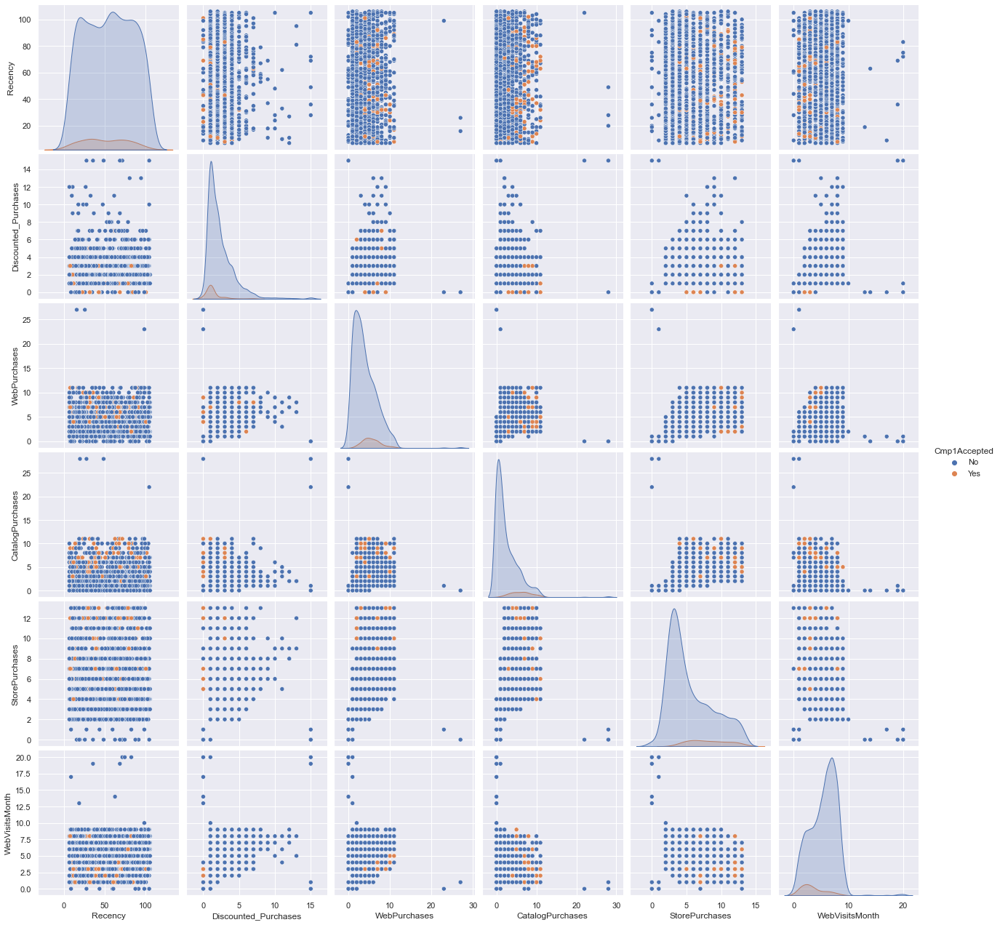

C:\Users\Hp\anaconda3\lib\site-packages\seaborn\axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


<Figure size 432x288 with 0 Axes>

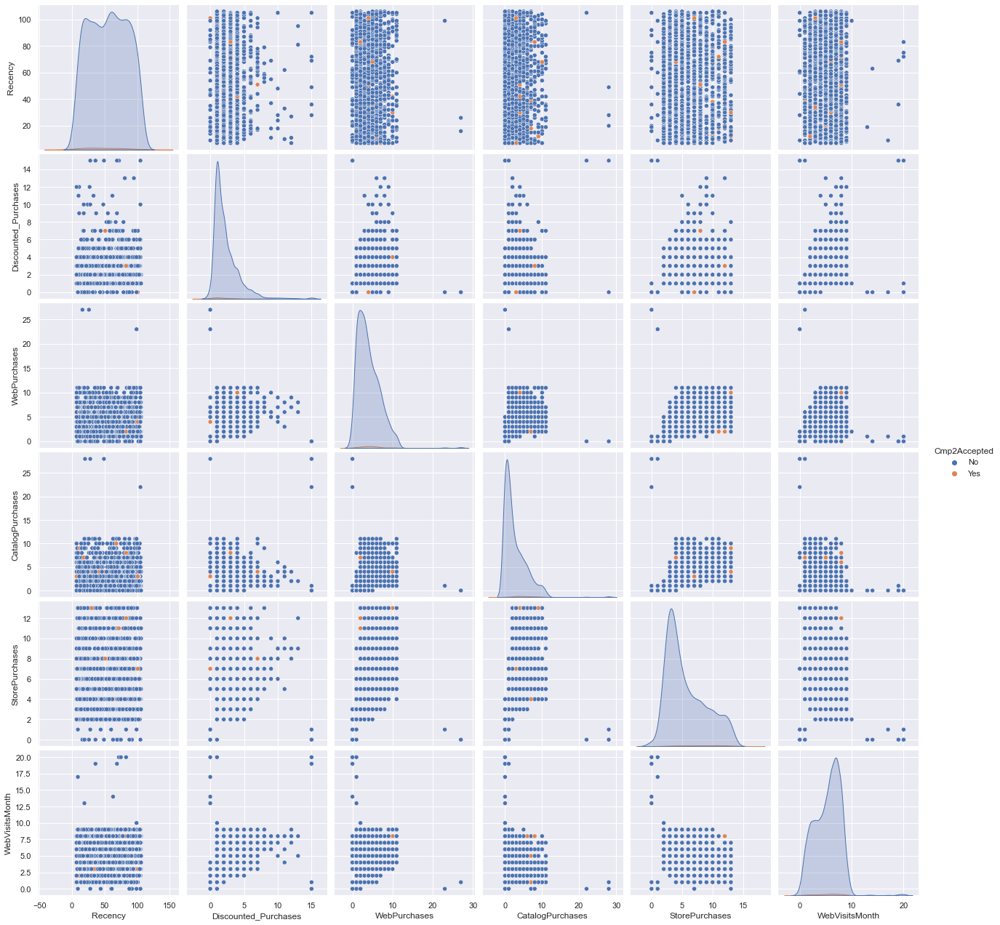

In [32]:
# VISUALIZATION (SCATTERPLOT FOR ALL FEATURES)
cat_col = ['Education_Level', 'Marital_Status','Any_Complain','Cmp1Accepted','Cmp2Accepted']
for col in cat_col:
    sns.set()
    cols = ['Education_Level', 
           'Recency', 'Discounted_Purchases','WebPurchases',
           'CatalogPurchases','StorePurchases',
            'WebVisitsMonth','Any_Complain','Marital_Status','Cmp1Accepted','Cmp2Accepted']
    plt.figure()
    sns.pairplot(train[cols], size = 3.0, hue=col)
    plt.show()

<Figure size 432x288 with 0 Axes>

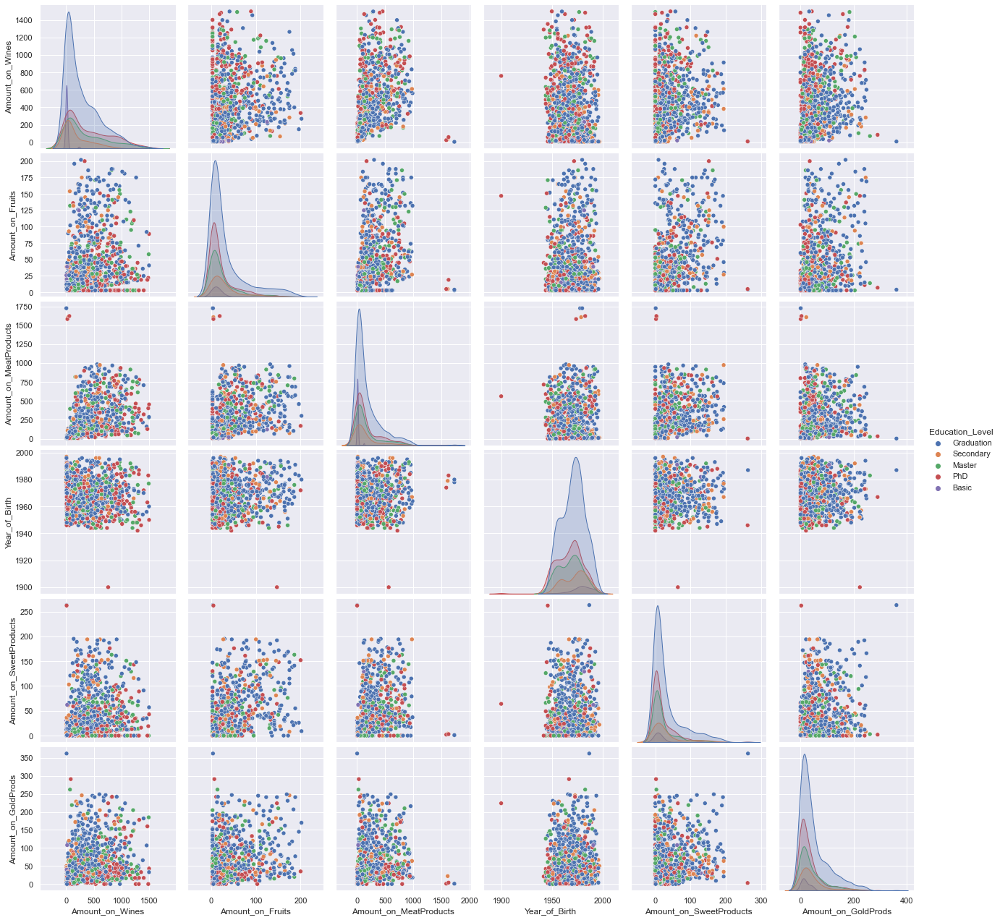

<Figure size 432x288 with 0 Axes>

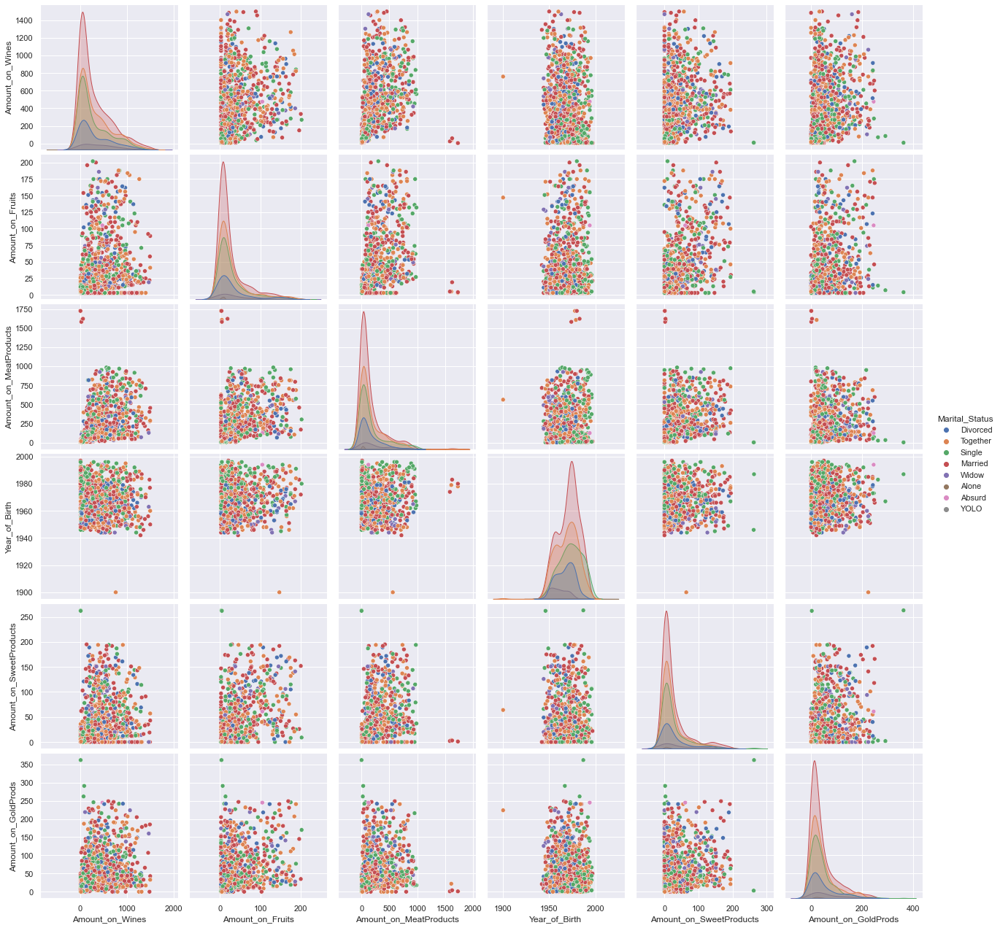

<Figure size 432x288 with 0 Axes>

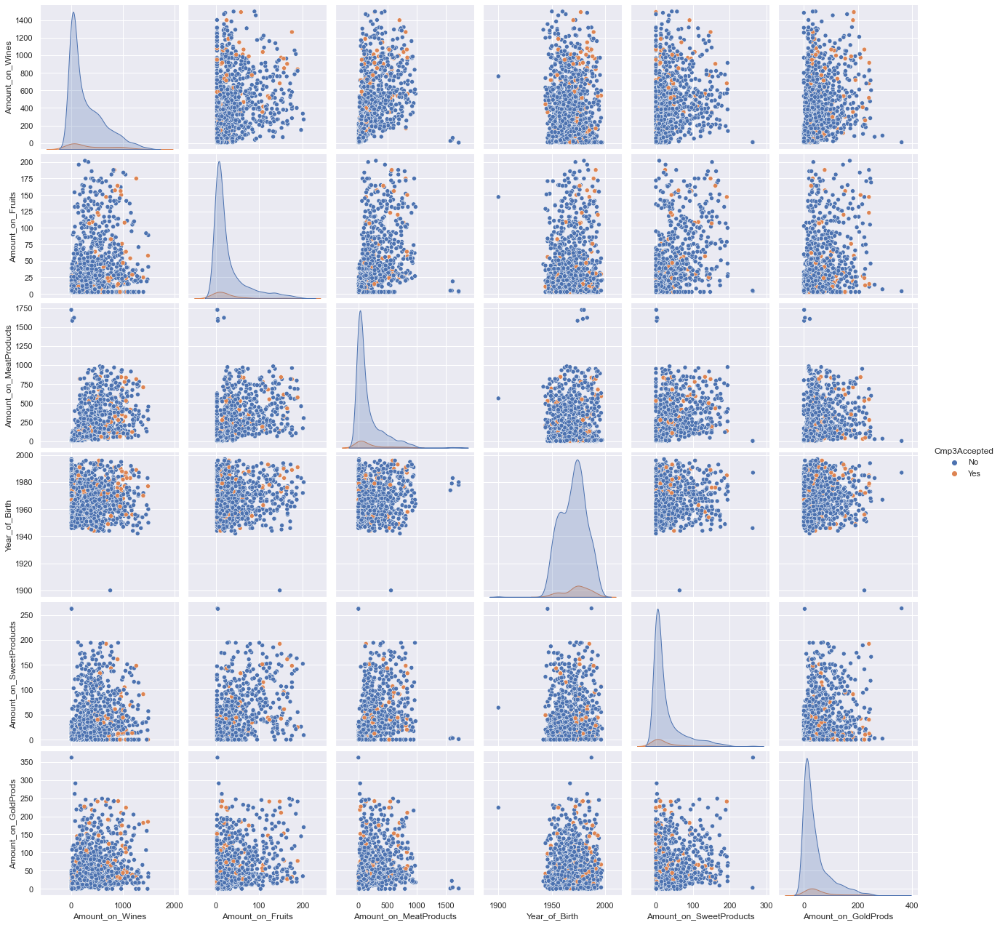

<Figure size 432x288 with 0 Axes>

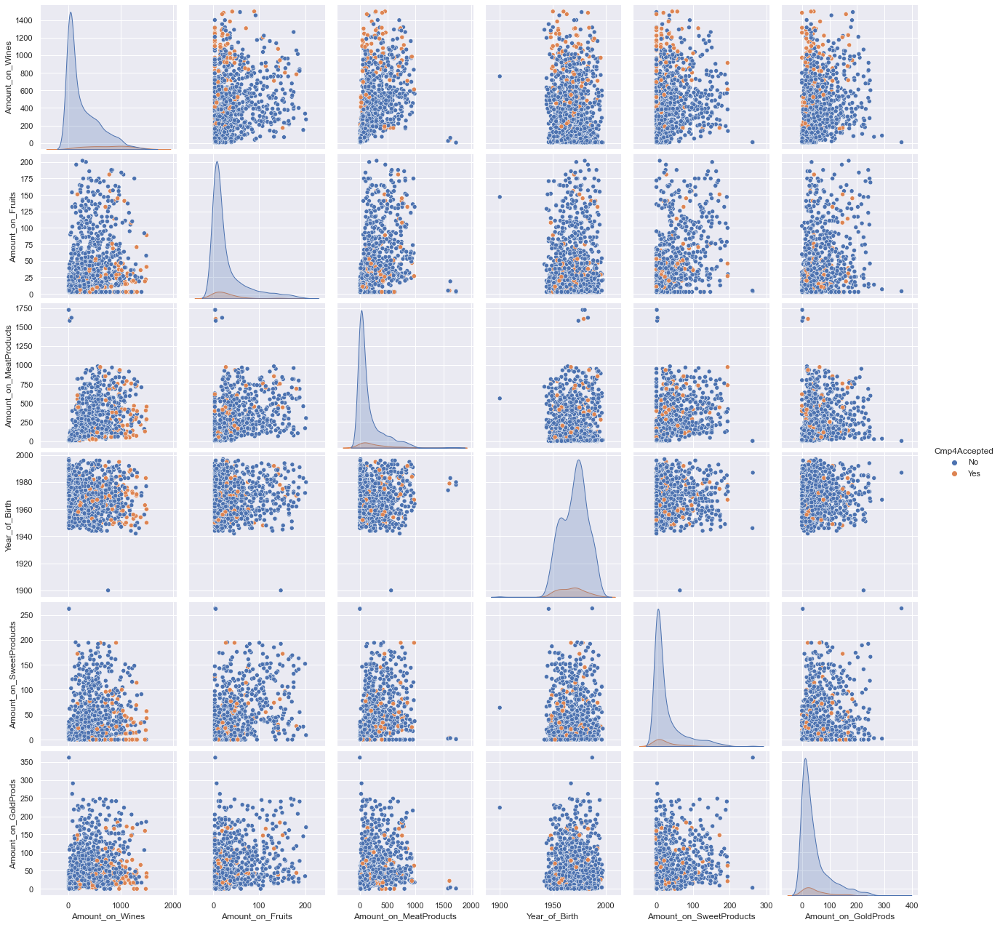

<Figure size 432x288 with 0 Axes>

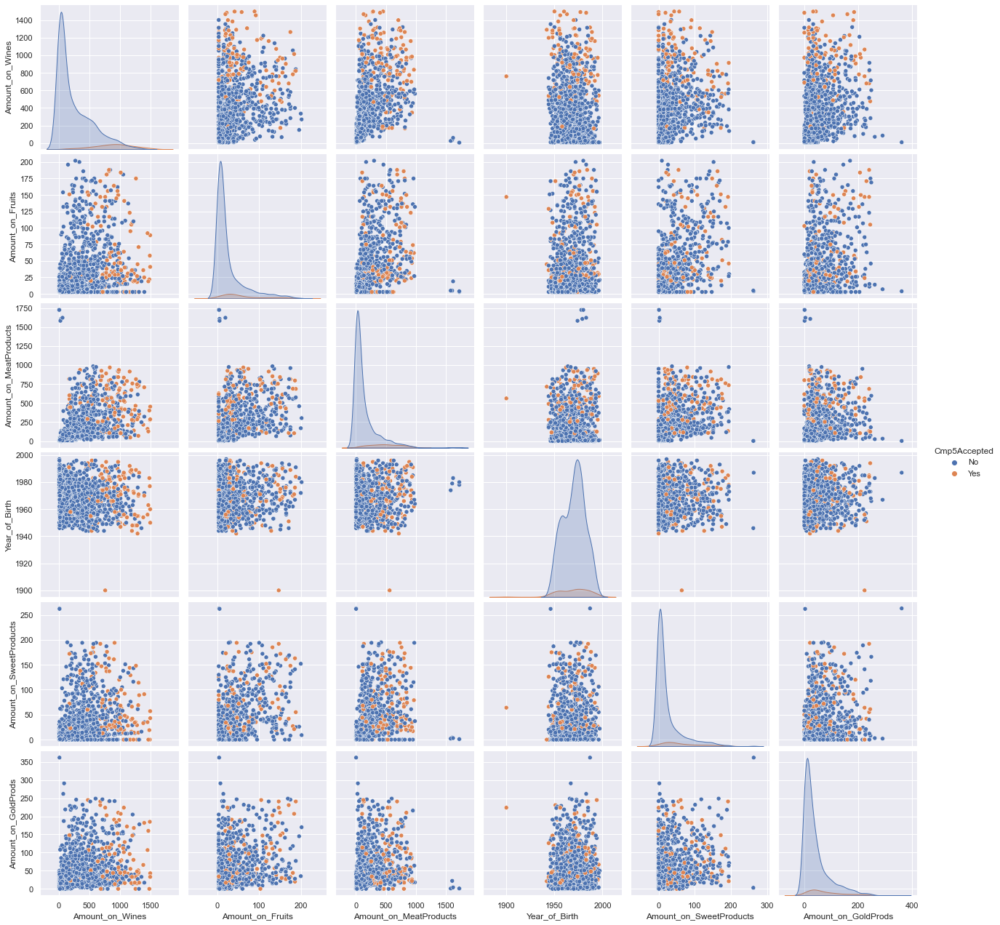

In [34]:
# VISUALIZATION (SCATTERPLOT FOR ALL FEATURES)
cat_col = ['Education_Level', 'Marital_Status','Cmp3Accepted','Cmp4Accepted','Cmp5Accepted']
for col in cat_col:
    sns.set()
    cols = ['Education_Level','Amount_on_Wines','Amount_on_Fruits',
           'Amount_on_MeatProducts','Year_of_Birth','Amount_on_SweetProducts','Amount_on_GoldProds','Marital_Status',
           'Cmp3Accepted','Cmp4Accepted',
           'Cmp5Accepted']
    plt.figure()
    sns.pairplot(train[cols], size = 3.0, hue=col)
    plt.show()

<AxesSubplot:xlabel='Any_Complain', ylabel='count'>

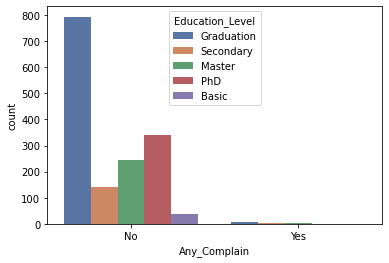

In [30]:
color = sns.color_palette('deep')[:2]
sns.countplot(train['Any_Complain'], palette = 'deep',hue = train['Education_Level'] )

<AxesSubplot:xlabel='Any_Complain', ylabel='count'>

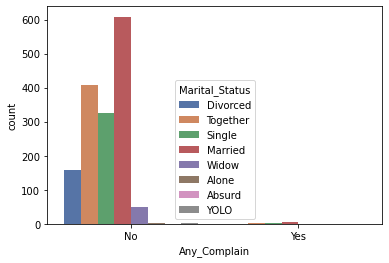

In [32]:
sns.countplot(train['Any_Complain'], palette = 'deep',hue = train['Marital_Status'],saturation=0.8 )

In [33]:
def countplot(a,b):
    str(a)
    str(b)
    plt.figure(figsize=(10,8), tight_layout = True)
    sns.countplot(train[a], palette = 'pastel' , hue = train[b])
    plt.legend(loc = 'upper right')
    plt.show()

In [34]:
sas = ['Any_Complain','Cmp1Accepted','Cmp2Accepted','Cmp3Accepted','Cmp4Accepted','Cmp5Accepted']
rot = ['Education_Level','Marital_Status']

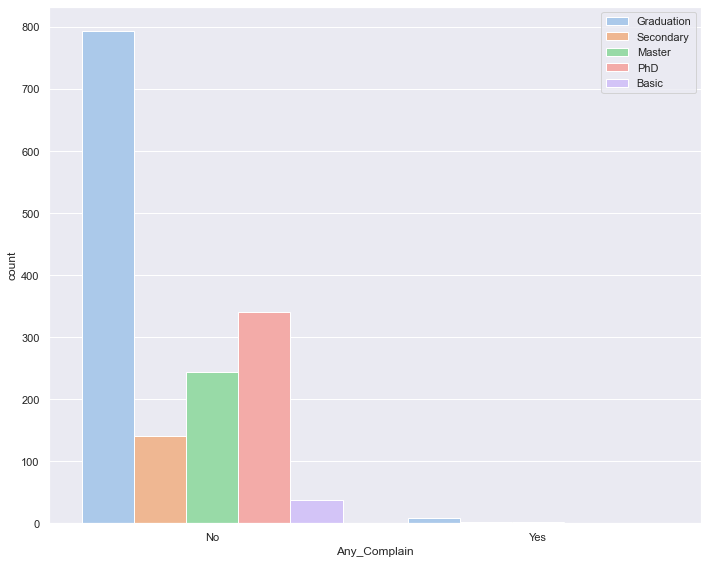

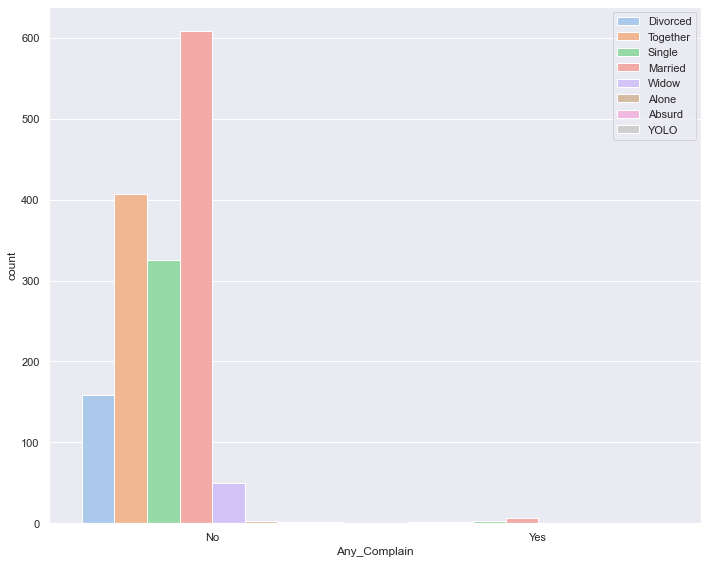

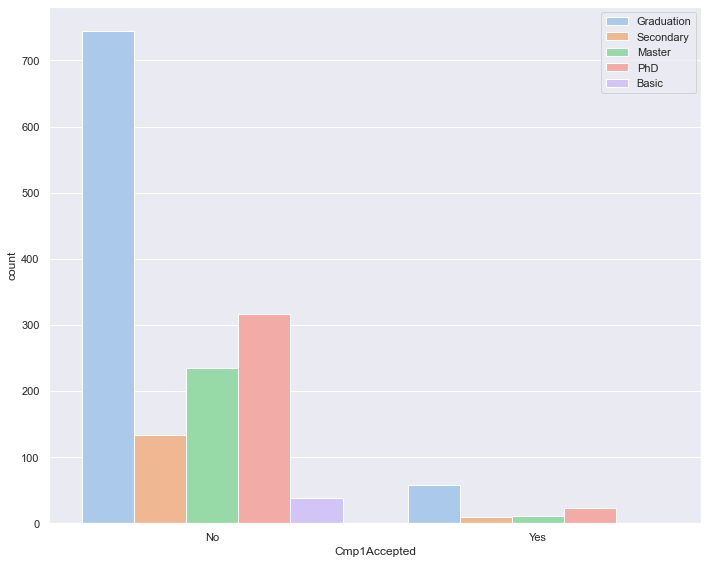

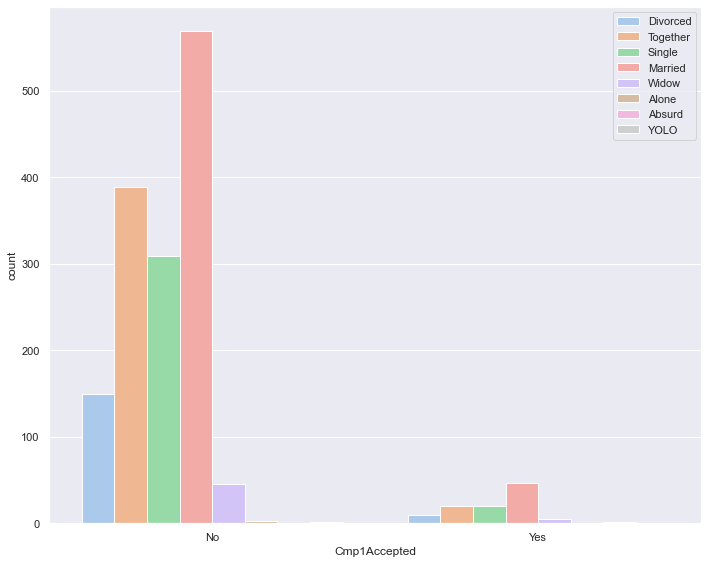

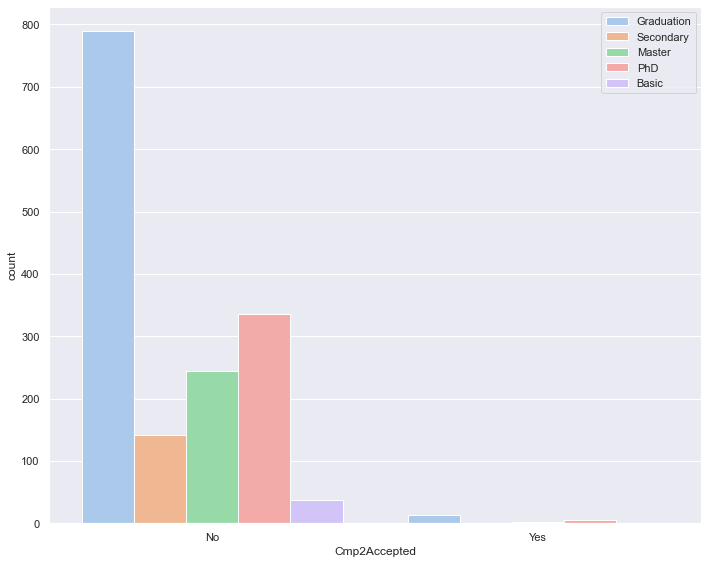

...

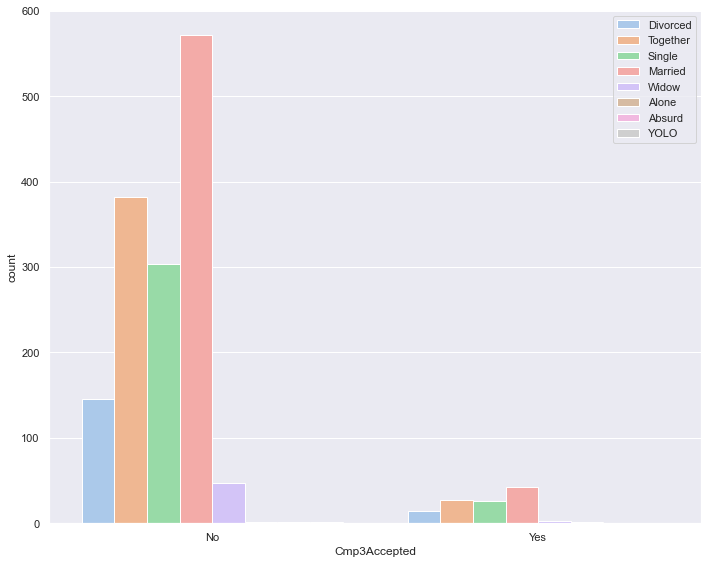

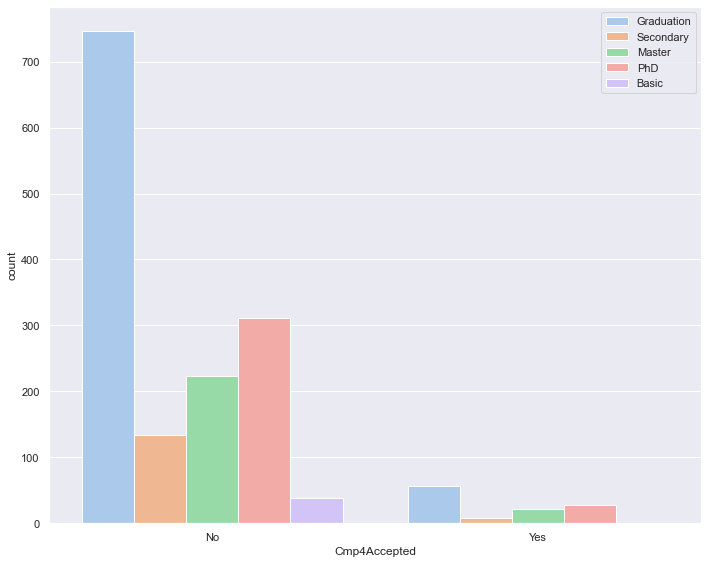

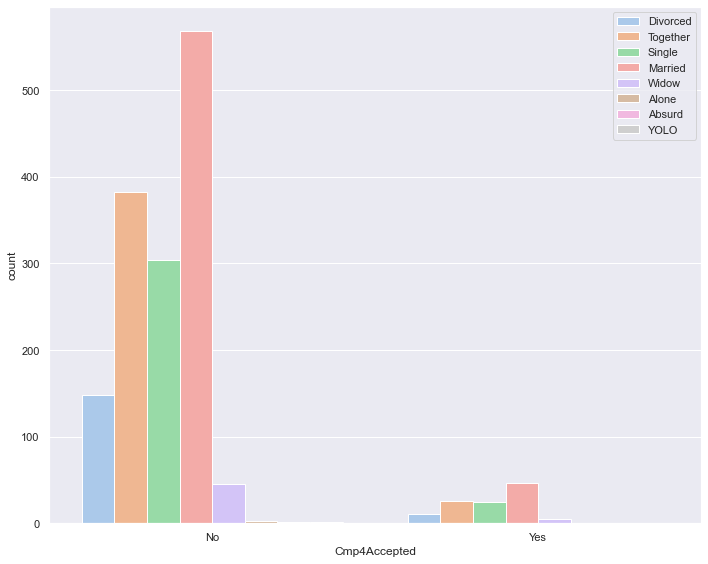

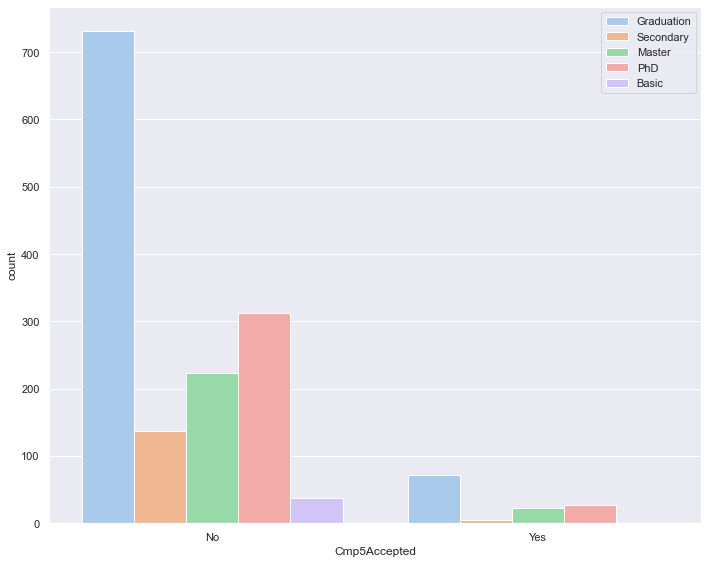

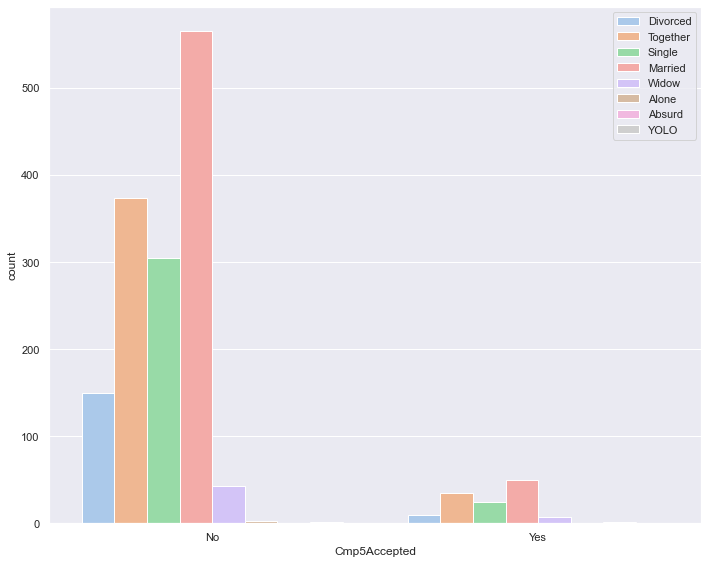

In [39]:
for i in sas:
    for j in rot:
        countplot(i,j)

## Checking for outliers

In [30]:
train.columns

Index(['ID', 'Year_of_Birth', 'Education_Level', 'Marital_Status',
       'Disposable_Income', 'No_of_Kids_in_home', 'No_of_Teen_in_home',
       'Date_Customer', 'Recency', 'Discounted_Purchases', 'WebPurchases',
       'CatalogPurchases', 'StorePurchases', 'Amount_on_Wines',
       'Amount_on_Fruits', 'Amount_on_MeatProducts', 'Amount_on_FishProducts',
       'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth',
       'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted',
       'Cmp2Accepted', 'Any_Complain', 'Response'],
      dtype='object')

In [31]:
Num = [feat for feat in train.columns if train[feat].dtype == 'int64']
Num

['Year_of_Birth',
 'No_of_Kids_in_home',
 'No_of_Teen_in_home',
 'Recency',
 'Discounted_Purchases',
 'WebPurchases',
 'CatalogPurchases',
 'StorePurchases',
 'Amount_on_Wines',
 'Amount_on_Fruits',
 'Amount_on_MeatProducts',
 'Amount_on_FishProducts',
 'Amount_on_SweetProducts',
 'Amount_on_GoldProds',
 'WebVisitsMonth',
 'Response']

In [32]:
Num.remove('No_of_Kids_in_home')
Num.remove('No_of_Teen_in_home')
Num.append('Disposable_Income')

In [33]:
Num

['Year_of_Birth',
 'Recency',
 'Discounted_Purchases',
 'WebPurchases',
 'CatalogPurchases',
 'StorePurchases',
 'Amount_on_Wines',
 'Amount_on_Fruits',
 'Amount_on_MeatProducts',
 'Amount_on_FishProducts',
 'Amount_on_SweetProducts',
 'Amount_on_GoldProds',
 'WebVisitsMonth',
 'Response',
 'Disposable_Income']

In [34]:
cat = [feat for feat in train.columns if feat not in Num]
cat

['ID',
 'Education_Level',
 'Marital_Status',
 'No_of_Kids_in_home',
 'No_of_Teen_in_home',
 'Date_Customer',
 'Cmp3Accepted',
 'Cmp4Accepted',
 'Cmp5Accepted',
 'Cmp1Accepted',
 'Cmp2Accepted',
 'Any_Complain']

In [35]:
i = ['ID', 'Date_Customer']
for t in i:
    cat.remove(t)

In [36]:
cat

['Education_Level',
 'Marital_Status',
 'No_of_Kids_in_home',
 'No_of_Teen_in_home',
 'Cmp3Accepted',
 'Cmp4Accepted',
 'Cmp5Accepted',
 'Cmp1Accepted',
 'Cmp2Accepted',
 'Any_Complain']

## Visualizing each feature to check for Outliers

In [37]:
def boxplot(j):
    str(i)
    str(j)
    plt.figure(figsize=(10,9))
    sns.boxplot(data = train, x = j, palette = 'deep', linewidth = 2.5)
    plt.show()

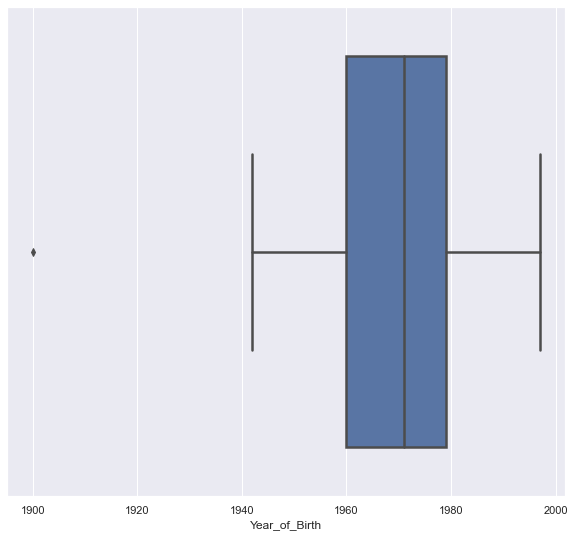

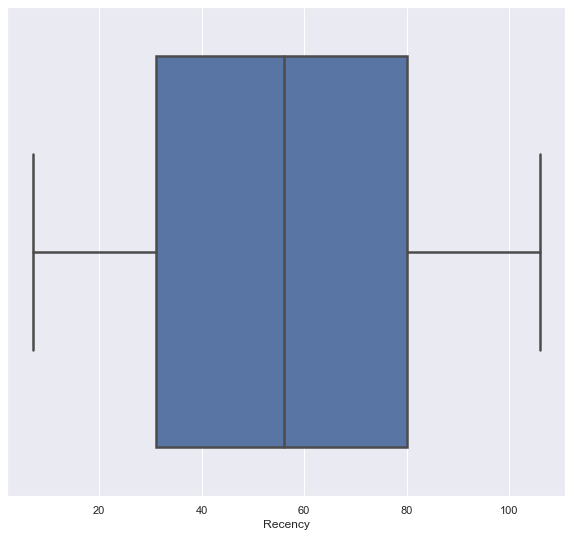

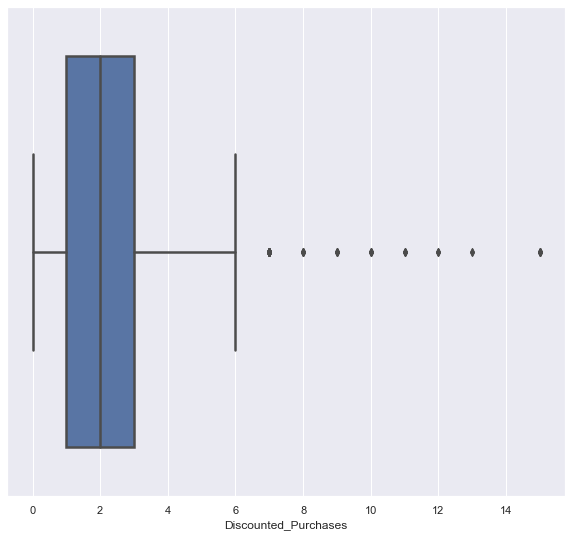

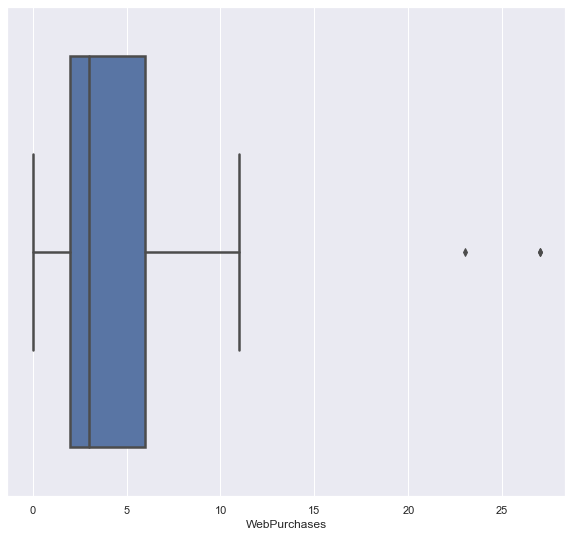

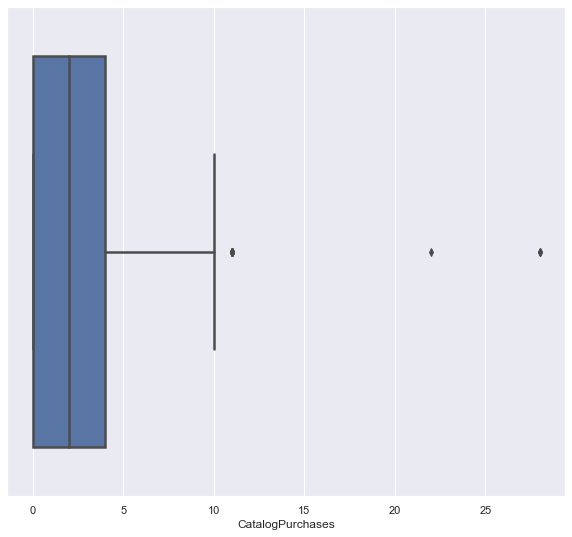

...

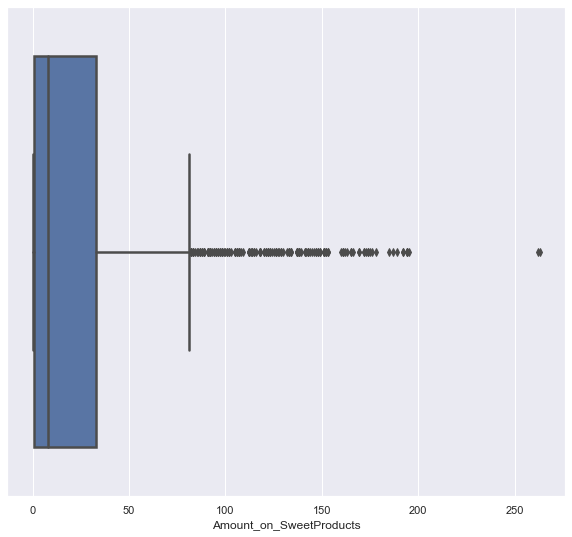

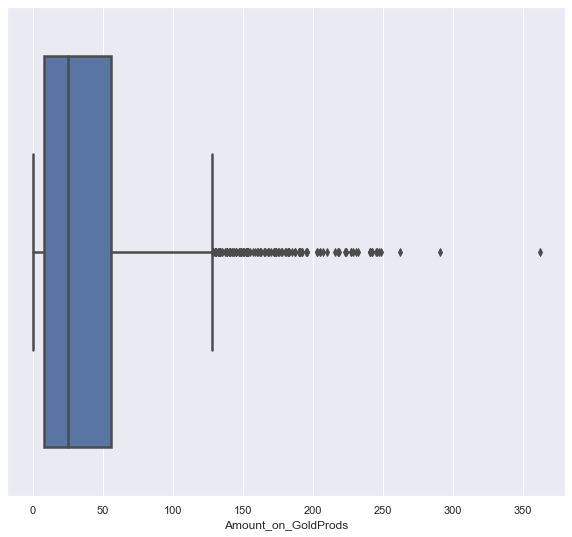

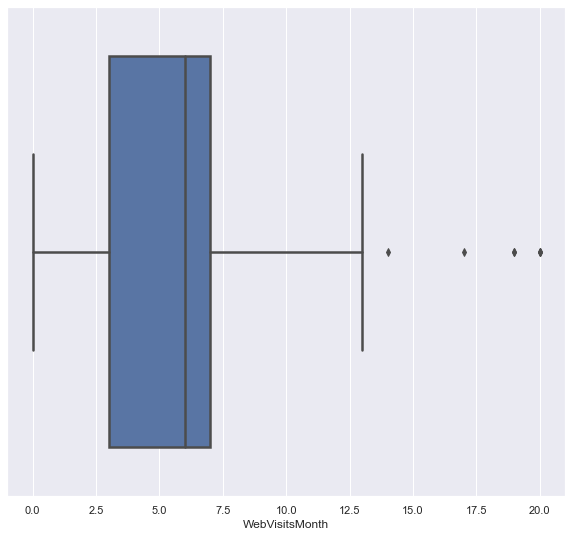

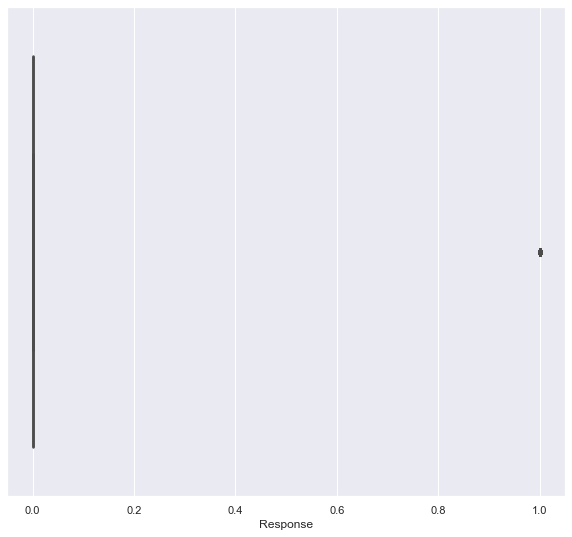

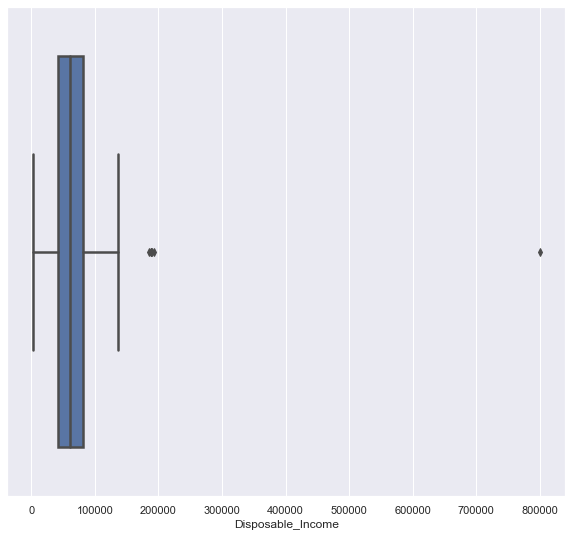

In [50]:
for j in Num:
    boxplot(j)

## Feature Engineering

In [38]:
fig = {'No':0,'Yes':1}
train['Any_Complain'] = train['Any_Complain'].map(fig)
train['Cmp3Accepted'] = train['Cmp3Accepted'].map(fig)
train['Cmp1Accepted'] = train['Cmp1Accepted'].map(fig)
train['Cmp2Accepted'] = train['Cmp2Accepted'].map(fig)
train['Cmp4Accepted'] = train['Cmp4Accepted'].map(fig)
train['Cmp5Accepted'] = train['Cmp5Accepted'].map(fig)

In [39]:
train

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,22-06-2014,56,2,...,6,20,3,0,0,0,0,0,0,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,01-08-2013,17,6,...,15,19,6,0,0,0,0,0,0,0
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,21-11-2013,17,0,...,18,37,2,0,0,0,1,0,0,1
3,ID_FQVZHE81,1979,Secondary,Single,46311.6,1,0,13-09-2013,49,3,...,24,24,8,0,0,0,0,0,0,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,21-01-2014,59,1,...,165,203,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1563,ID_XWINUFGG,1970,Graduation,Married,52893.6,1,1,19-06-2014,24,2,...,0,4,5,0,0,0,0,0,0,0
1564,ID_GLVIHZLR,1980,Graduation,Single,74190.0,0,1,07-08-2013,63,1,...,30,27,4,0,0,0,0,0,0,0
1565,ID_O11VSIJY,1952,Master,Married,80857.2,0,1,15-01-2013,74,4,...,0,70,7,0,1,0,0,0,0,0
1566,ID_VS37P6MS,1964,PhD,Single,58701.6,1,1,12-04-2014,28,2,...,0,1,4,0,0,0,0,0,0,0


In [40]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Year_of_Birth,1568.0,1970.073342,11.920781,1900.0,1960.0,1971.0,1979.00,1997.0
Disposable_Income,1568.0,62411.524073,31997.410155,2076.0,41763.0,61060.8,81493.20,799999.2
No_of_Kids_in_home,1568.0,0.460459,0.540361,0.0,0.0,0.0,1.00,2.0
No_of_Teen_in_home,1568.0,0.497449,0.544151,0.0,0.0,0.0,1.00,2.0
Recency,1568.0,55.408801,28.788037,7.0,31.0,56.0,80.00,106.0
Discounted_Purchases,1568.0,2.292730,1.937544,0.0,1.0,2.0,3.00,15.0
WebPurchases,1568.0,4.001276,2.773748,0.0,2.0,3.0,6.00,27.0
CatalogPurchases,1568.0,2.665816,3.043493,0.0,0.0,2.0,4.00,28.0
StorePurchases,1568.0,5.703444,3.260553,0.0,3.0,5.0,8.00,13.0
Amount_on_Wines,1568.0,303.190051,340.141396,5.0,27.0,167.0,499.50,1498.0


In [41]:
##Saving our dataset
train.to_csv('traindf.csv', index=False)

In [42]:
train_y = train['Response']
train_y

0       0
1       0
2       1
3       0
4       0
       ..
1563    0
1564    0
1565    0
1566    0
1567    0
Name: Response, Length: 1568, dtype: int64

In [43]:
train_y.to_csv('train_y.csv', index=False)

In [44]:
train_df = train.drop('Response', axis=1)

In [45]:
train_df.shape

(1568, 26)

#### Importing our test dataset

In [46]:
test = pd.read_csv('testdf.csv')
test

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain
0,ID_ZPMABNVX,1954,Graduation,Single,48556.8,0,1,11-01-2013,85,6,...,7,23,41,8,0,0,0,0,0,0
1,ID_WFE91NAA,1961,Graduation,Widow,57499.2,0,1,22-11-2012,79,5,...,0,0,75,6,0,1,0,0,0,0
2,ID_JV11RBRK,1973,Basic,Married,17025.6,0,0,28-02-2013,47,1,...,16,12,27,6,0,0,0,0,0,0
3,ID_6B7SVKY9,1970,Graduation,Together,91983.6,0,0,16-08-2013,98,1,...,219,189,126,2,0,0,1,1,0,0
4,ID_GOVUZ545,1959,Graduation,Together,78235.2,0,2,25-07-2013,41,2,...,12,0,200,5,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,ID_1D68PV28,1975,Graduation,Married,80934.0,0,1,12-08-2012,70,5,...,29,80,11,6,0,0,0,0,0,0
668,ID_TM6CYFZO,1955,Graduation,Divorced,84052.8,0,1,18-02-2013,53,4,...,153,14,14,5,0,0,0,0,0,0
669,ID_VHR666SC,1952,PhD,Married,63974.4,0,0,09-08-2013,39,1,...,0,0,25,7,0,0,0,0,0,0
670,ID_O852YAO1,1960,Graduation,Together,69548.4,0,1,19-08-2013,31,7,...,77,5,29,3,0,0,0,0,0,1


In [47]:
test.shape, train_df.shape

((672, 26), (1568, 26))

In [48]:
test.shape[0] + train_df.shape[0]

2240

In [49]:
## Combining our test and train dataset for proper preprocessing
main_df = pd.concat([train_df,test], axis = 0)

In [50]:
main_df

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,22-06-2014,56,2,...,0,6,20,3,0,0,0,0,0,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,01-08-2013,17,6,...,50,15,19,6,0,0,0,0,0,0
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,21-11-2013,17,0,...,29,18,37,2,0,0,0,1,0,0
3,ID_FQVZHE81,1979,Secondary,Single,46311.6,1,0,13-09-2013,49,3,...,17,24,24,8,0,0,0,0,0,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,21-01-2014,59,1,...,181,165,203,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,ID_1D68PV28,1975,Graduation,Married,80934.0,0,1,12-08-2012,70,5,...,29,80,11,6,0,0,0,0,0,0
668,ID_TM6CYFZO,1955,Graduation,Divorced,84052.8,0,1,18-02-2013,53,4,...,153,14,14,5,0,0,0,0,0,0
669,ID_VHR666SC,1952,PhD,Married,63974.4,0,0,09-08-2013,39,1,...,0,0,25,7,0,0,0,0,0,0
670,ID_O852YAO1,1960,Graduation,Together,69548.4,0,1,19-08-2013,31,7,...,77,5,29,3,0,0,0,0,0,1


In [51]:
main_df.to_csv('combined_df.csv', index=False)

### Engineering date features

In [52]:
main_df['Date_Customer'] = pd.to_datetime(main_df['Date_Customer'])

In [53]:
main_df['Birth'] = main_df['Year_of_Birth'].copy()

In [54]:
main_df.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Birth
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,...,6,20,3,0,0,0,0,0,0,1955
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,...,15,19,6,0,0,0,0,0,0,1958
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,...,18,37,2,0,0,0,1,0,0,1962
3,ID_FQVZHE81,1979,Secondary,Single,46311.6,1,0,2013-09-13,49,3,...,24,24,8,0,0,0,0,0,0,1979
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,...,165,203,1,0,0,0,1,0,0,1959


In [55]:
main_df['Enrol_year'] = main_df['Date_Customer'].dt.year
main_df['Enrol_Month'] = main_df['Date_Customer'].dt.month

In [56]:
main_df.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Birth,Enrol_year,Enrol_Month
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,...,3,0,0,0,0,0,0,1955,2014,6
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,...,6,0,0,0,0,0,0,1958,2013,1
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,...,2,0,0,0,1,0,0,1962,2013,11
3,ID_FQVZHE81,1979,Secondary,Single,46311.6,1,0,2013-09-13,49,3,...,8,0,0,0,0,0,0,1979,2013,9
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,...,1,0,0,0,1,0,0,1959,2014,1


In [57]:
main_df['Enrol_Age'] = main_df['Enrol_year'] - main_df['Birth']

In [58]:
main_df.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Birth,Enrol_year,Enrol_Month,Enrol_Age
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,...,0,0,0,0,0,0,1955,2014,6,59
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,...,0,0,0,0,0,0,1958,2013,1,55
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,...,0,0,0,1,0,0,1962,2013,11,51
3,ID_FQVZHE81,1979,Secondary,Single,46311.6,1,0,2013-09-13,49,3,...,0,0,0,0,0,0,1979,2013,9,34
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,...,0,0,0,1,0,0,1959,2014,1,55


In [59]:
def day_of_week(date):
    day = date.strftime('%A')
    return day
    

In [60]:
main_df['Enrol_day'] = main_df['Date_Customer'].dt.day

In [61]:
main_df['Enrol_wkday'] = main_df['Date_Customer'].apply(day_of_week)

In [62]:
main_df.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Birth,Enrol_year,Enrol_Month,Enrol_Age,Enrol_day,Enrol_wkday
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,...,0,0,0,0,1955,2014,6,59,22,Sunday
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,...,0,0,0,0,1958,2013,1,55,8,Tuesday
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,...,0,1,0,0,1962,2013,11,51,21,Thursday
3,ID_FQVZHE81,1979,Secondary,Single,46311.6,1,0,2013-09-13,49,3,...,0,0,0,0,1979,2013,9,34,13,Friday
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,...,0,1,0,0,1959,2014,1,55,21,Tuesday


## Engineering the Marital_Status Feature

In [63]:
clas = ['Alone', 'Absurd', 'YOLO']
def marital(status):
    if status not in clas:
        return status
    else:
        return 'others'

In [64]:
main_df['Marital_Status'] = main_df['Marital_Status'].apply(marital)

In [65]:
main_df['Marital_Status'].value_counts()

Married     864
Together    580
Single      480
Divorced    232
Widow        77
others        7
Name: Marital_Status, dtype: int64

In [66]:
def clus(year):
    if year <= 1940:
        return 0
    else:
        return 1

In [67]:
main_df['Year_Birth_Clus'] = main_df['Year_of_Birth'].apply(clus)

In [68]:
main_df.head().T

,0,1,2,3,4
ID,ID_4A9AR6FQ,ID_X28T3VEK,ID_AWXARH57,ID_FQVZHE81,ID_QVLWGPRN
Year_of_Birth,1955,1958,1962,1979,1959
Education_Level,Graduation,Graduation,Graduation,Secondary,Graduation
Marital_Status,Divorced,Together,Single,Single,Married
Disposable_Income,77504.4,56784,103715,46311.6,87486
No_of_Kids_in_home,1,0,0,1,0
No_of_Teen_in_home,1,1,0,0,0
Date_Customer,2014-06-22 00:00:00,2013-01-08 00:00:00,2013-11-21 00:00:00,2013-09-13 00:00:00,2014-01-21 00:00:00
Recency,56,17,17,49,59
Discounted_Purchases,2,6,0,3,1


In [69]:
def cat_pur(value):
    if value <= 12:
        return 0
    else:
        return 1

In [70]:
def web_pur(value):
    if value <= 12:
        return 0
    else:
        return 1
    

In [71]:
def web_visit(value):
    if value <= 12.5:
        return 0
    else:
        return 1

In [72]:
main_df['CatPurchase_Clus'] = main_df['CatalogPurchases'].apply(cat_pur)
main_df['WebPurchuse_Clus'] = main_df['WebPurchases'].apply(web_pur)
main_df['WebVisit_Clus'] = main_df['WebVisitsMonth'].apply(web_visit)

In [73]:
main_df.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Birth,Enrol_year,Enrol_Month,Enrol_Age,Enrol_day,Enrol_wkday,Year_Birth_Clus,CatPurchase_Clus,WebPurchuse_Clus,WebVisit_Clus
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,...,1955,2014,6,59,22,Sunday,1,0,0,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,...,1958,2013,1,55,8,Tuesday,1,0,0,0
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,...,1962,2013,11,51,21,Thursday,1,0,0,0
3,ID_FQVZHE81,1979,Secondary,Single,46311.6,1,0,2013-09-13,49,3,...,1979,2013,9,34,13,Friday,1,0,0,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,...,1959,2014,1,55,21,Tuesday,1,0,0,0


In [74]:
Education = {'Basic':1,'Secondary': 2, 'Master':3,'PhD':4,'Graduation':5}
main_df['Education_Ordinal'] = main_df['Education_Level'].map(Education)

In [75]:
main_df.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Enrol_year,Enrol_Month,Enrol_Age,Enrol_day,Enrol_wkday,Year_Birth_Clus,CatPurchase_Clus,WebPurchuse_Clus,WebVisit_Clus,Education_Ordinal
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,...,2014,6,59,22,Sunday,1,0,0,0,5
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,...,2013,1,55,8,Tuesday,1,0,0,0,5
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,...,2013,11,51,21,Thursday,1,0,0,0,5
3,ID_FQVZHE81,1979,Secondary,Single,46311.6,1,0,2013-09-13,49,3,...,2013,9,34,13,Friday,1,0,0,0,2
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,...,2014,1,55,21,Tuesday,1,0,0,0,5


In [76]:
prepdf = main_df.copy()

In [77]:
prepdf.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Enrol_year,Enrol_Month,Enrol_Age,Enrol_day,Enrol_wkday,Year_Birth_Clus,CatPurchase_Clus,WebPurchuse_Clus,WebVisit_Clus,Education_Ordinal
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,...,2014,6,59,22,Sunday,1,0,0,0,5
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,...,2013,1,55,8,Tuesday,1,0,0,0,5
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,...,2013,11,51,21,Thursday,1,0,0,0,5
3,ID_FQVZHE81,1979,Secondary,Single,46311.6,1,0,2013-09-13,49,3,...,2013,9,34,13,Friday,1,0,0,0,2
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,...,2014,1,55,21,Tuesday,1,0,0,0,5


In [78]:
prepdf.drop(['ID','Education_Level'], axis=1, inplace=True)

In [79]:
prepdf.drop(['Date_Customer','Birth'], axis=1, inplace=True)

In [80]:
prepdf.head()

,Year_of_Birth,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,...,Enrol_year,Enrol_Month,Enrol_Age,Enrol_day,Enrol_wkday,Year_Birth_Clus,CatPurchase_Clus,WebPurchuse_Clus,WebVisit_Clus,Education_Ordinal
0,1955,Divorced,77504.4,1,1,56,2,1,1,4,...,2014,6,59,22,Sunday,1,0,0,0,5
1,1958,Together,56784.0,0,1,17,6,5,1,8,...,2013,1,55,8,Tuesday,1,0,0,0,5
2,1962,Single,103714.8,0,0,17,0,7,4,7,...,2013,11,51,21,Thursday,1,0,0,0,5
3,1979,Single,46311.6,1,0,49,3,4,1,3,...,2013,9,34,13,Friday,1,0,0,0,2
4,1959,Married,87486.0,0,0,59,1,3,7,9,...,2014,1,55,21,Tuesday,1,0,0,0,5


In [81]:
def marry(value):
    if value == 'others':
        return 'Single'
    else:
        return value

In [82]:
prepdf['Marital_Status'] = prepdf['Marital_Status'].apply(marry)

In [83]:
prepdf['Marital_Status'].value_counts()

Married     864
Together    580
Single      487
Divorced    232
Widow        77
Name: Marital_Status, dtype: int64

In [84]:
from sklearn.preprocessing import LabelEncoder

In [85]:
le = LabelEncoder()

prepdf['Marital_Status'] = le.fit_transform(prepdf.Marital_Status)

In [86]:
prepdf['Enrol_wkday'] = le.fit_transform(prepdf.Enrol_wkday)

In [87]:
prepdf.head()

,Year_of_Birth,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,...,Enrol_year,Enrol_Month,Enrol_Age,Enrol_day,Enrol_wkday,Year_Birth_Clus,CatPurchase_Clus,WebPurchuse_Clus,WebVisit_Clus,Education_Ordinal
0,1955,0,77504.4,1,1,56,2,1,1,4,...,2014,6,59,22,3,1,0,0,0,5
1,1958,3,56784.0,0,1,17,6,5,1,8,...,2013,1,55,8,5,1,0,0,0,5
2,1962,2,103714.8,0,0,17,0,7,4,7,...,2013,11,51,21,4,1,0,0,0,5
3,1979,2,46311.6,1,0,49,3,4,1,3,...,2013,9,34,13,0,1,0,0,0,2
4,1959,1,87486.0,0,0,59,1,3,7,9,...,2014,1,55,21,5,1,0,0,0,5


## Centralizing Undistributed Features

In [ ]:
#Create a subplot 
fig, ax = plt.subplots(1,2)             

#Plot the normal Amount_on_Wines on the first axis
sns.distplot(prepdf['Amount_on_Wines'], bins = 10, ax=ax[0])

#Transform the Amount_on_Wines and plot on the second axis
prepdf["Amount_on_Wines"] = np.log1p(prepdf["Amount_on_Wines"])
prepdf["Amount_on_Wines"]
sns.distplot(prepdf['Amount_on_Wines'], bins = 8, ax = ax[1])

plt.tight_layout()
plt.title("Transformation of Amount_on_Wines", loc='right');

In [88]:
prepdf['Amount_on_Wines'] = np.log1p(prepdf['Amount_on_Wines'])
prepdf['Amount_on_Fruits'] = np.log1p(prepdf['Amount_on_Fruits'])
prepdf['Amount_on_MeatProducts'] = np.log1p(prepdf['Amount_on_MeatProducts'])
prepdf['Amount_on_FishProducts'] = np.log1p(prepdf['Amount_on_FishProducts'])
prepdf['Amount_on_SweetProducts'] = np.log1p(prepdf['Amount_on_SweetProducts'])
prepdf['Amount_on_GoldProds'] = np.log1p(prepdf['Amount_on_GoldProds'])

In [89]:
prepdf.describe().T

,count,mean,std,min,25%,50%,75%,max
Year_of_Birth,2240.0,1969.805804,11.984069,1894.000000,1960.000000,1971.000000,1978.000000,1997.000000
Marital_Status,2240.0,1.734821,1.061420,0.000000,1.000000,2.000000,3.000000,4.000000
Disposable_Income,2240.0,62659.392309,30116.766119,2076.000000,42382.273818,61610.400000,82161.900000,799999.200000
No_of_Kids_in_home,2240.0,0.444196,0.538398,0.000000,0.000000,0.000000,1.000000,2.000000
No_of_Teen_in_home,2240.0,0.506250,0.544538,0.000000,0.000000,0.000000,1.000000,2.000000
Recency,2240.0,56.109375,28.962453,7.000000,31.000000,56.000000,81.000000,106.000000
Discounted_Purchases,2240.0,2.325000,1.932238,0.000000,1.000000,2.000000,3.000000,15.000000
WebPurchases,2240.0,4.084821,2.778714,0.000000,2.000000,4.000000,6.000000,27.000000
CatalogPurchases,2240.0,2.662054,2.923101,0.000000,0.000000,2.000000,4.000000,28.000000
StorePurchases,2240.0,5.790179,3.250958,0.000000,3.000000,5.000000,8.000000,13.000000


In [90]:
train_ = prepdf[:1568]
test_= prepdf[1568:]

In [91]:
train_y.head(2)

0    0
1    0
Name: Response, dtype: int64

In [92]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(train_,train_y, test_size = 0.2, random_state = 42)

In [93]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1254, 33), (314, 33), (1254,), (314,))

## Removing Outliers

In [94]:
from feature_engine.outliers import Winsorizer

In [95]:
capper = Winsorizer(capping_method='gaussian', tail='both', fold=3, variables=['Discounted_Purchases', 'WebPurchases',
                                                                               'CatalogPurchases',
                                                                               'Amount_on_Wines','Amount_on_Fruits',
                                                                               'Amount_on_MeatProducts',
                                                                               'Amount_on_FishProducts',
                                                                               'Amount_on_SweetProducts',
                                                                               'Amount_on_GoldProds','WebVisitsMonth',
                                                                               'Disposable_Income'])

In [96]:
capper.fit(X_train)

Winsorizer(tail='both',
           variables=['Discounted_Purchases', 'WebPurchases',
                      'CatalogPurchases', 'Amount_on_Wines', 'Amount_on_Fruits',
                      'Amount_on_MeatProducts', 'Amount_on_FishProducts',
                      'Amount_on_SweetProducts', 'Amount_on_GoldProds',
                      'WebVisitsMonth', 'Disposable_Income'])

In [97]:
X_train = capper.transform(X_train)

In [98]:
X_train

,Year_of_Birth,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,...,Enrol_year,Enrol_Month,Enrol_Age,Enrol_day,Enrol_wkday,Year_Birth_Clus,CatPurchase_Clus,WebPurchuse_Clus,WebVisit_Clus,Education_Ordinal
1085,1965,1,48960.0,1,2,84,2.0,3.0,0.0,3,...,2013,1,48,1,5,1,0,0,0,5
208,1980,3,41220.0,1,0,88,1.0,1.0,0.0,3,...,2013,10,33,19,2,1,0,0,0,5
1053,1973,3,55263.6,1,0,53,3.0,3.0,2.0,4,...,2013,2,40,17,3,1,0,0,0,5
451,1993,2,111430.8,0,0,53,1.0,5.0,4.0,12,...,2012,10,19,19,0,1,0,0,0,3
415,1979,3,27330.0,1,0,47,1.0,1.0,0.0,2,...,2013,6,34,19,6,1,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,1961,2,38661.6,0,0,34,1.0,2.0,1.0,3,...,2014,2,53,15,2,1,0,0,0,2
1294,1975,3,51621.6,0,1,53,1.0,2.0,2.0,2,...,2013,1,38,11,0,1,0,0,0,3
860,1982,1,41334.0,0,0,99,6.0,11.0,2.0,8,...,2013,1,31,27,3,1,0,0,0,1
1459,1978,3,30378.0,1,0,53,3.0,3.0,0.0,3,...,2013,7,35,11,4,1,0,0,0,2


In [99]:
capper.right_tail_caps_

{'Discounted_Purchases': 8.16124615082892,
 'WebPurchases': 12.52136762970716,
 'CatalogPurchases': 11.628901581778265,
 'Amount_on_Wines': 9.501797978602998,
 'Amount_on_Fruits': 6.108362735765445,
 'Amount_on_MeatProducts': 8.834812259427952,
 'Amount_on_FishProducts': 7.462524381914908,
 'Amount_on_SweetProducts': 7.019044245493987,
 'Amount_on_GoldProds': 6.991289322026471,
 'WebVisitsMonth': 12.623061102897797,
 'Disposable_Income': 162693.59452883038}

In [100]:
capper.left_tail_caps_

{'Discounted_Purchases': -3.5504008557730984,
 'WebPurchases': -4.478305428750223,
 'CatalogPurchases': -6.324276382416223,
 'Amount_on_Wines': 0.023889126184442055,
 'Amount_on_Fruits': -0.6627109973687535,
 'Amount_on_MeatProducts': -0.6431132295211341,
 'Amount_on_FishProducts': -2.365422492171244,
 'Amount_on_SweetProducts': -2.5727139710702818,
 'Amount_on_GoldProds': -0.753683198198134,
 'WebVisitsMonth': -1.9452301619089623,
 'Disposable_Income': -38207.97810599017}

## Balancing Our Dataset

In [101]:
train_y.value_counts()

0    1329
1     239
Name: Response, dtype: int64

## Class Distribution

<AxesSubplot:ylabel='Response'>

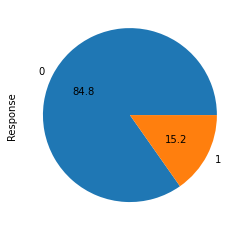

In [102]:
train_y.value_counts().plot.pie(autopct = '%0.1f')

## Class Balancing

In [103]:
from imblearn.over_sampling import RandomOverSampler
res = RandomOverSampler(sampling_strategy = 'not majority')
X_train_res,y_train_res = res.fit_resample(X_train,y_train)

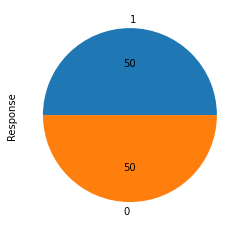

In [104]:
ax = y_train_res.value_counts().plot.pie(autopct='%0.0f')

In [105]:
X_train_res.shape

(2114, 33)

In [106]:
y_train_res.shape

(2114,)

## Normalization and Scaling

In [186]:
from sklearn.preprocessing import StandardScaler

scale = StandardScaler()
X = scale.fit_transform(X_train_res)
test = scale.transform(X_test)
testing = scale.transform(test_)
X=pd.DataFrame(X, columns = X_train_res.columns)
test = pd.DataFrame(test, columns = X_train_res.columns)
testing=pd.DataFrame(testing, columns = X_train_res.columns)

In [187]:
X.columns

Index(['Year_of_Birth', 'Marital_Status', 'Disposable_Income',
       'No_of_Kids_in_home', 'No_of_Teen_in_home', 'Recency',
       'Discounted_Purchases', 'WebPurchases', 'CatalogPurchases',
       'StorePurchases', 'Amount_on_Wines', 'Amount_on_Fruits',
       'Amount_on_MeatProducts', 'Amount_on_FishProducts',
       'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth',
       'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted',
       'Cmp2Accepted', 'Any_Complain', 'Enrol_year', 'Enrol_Month',
       'Enrol_Age', 'Enrol_day', 'Enrol_wkday', 'Year_Birth_Clus',
       'CatPurchase_Clus', 'WebPurchuse_Clus', 'WebVisit_Clus',
       'Education_Ordinal'],
      dtype='object')

## Feature Selection

In [188]:
X.head(2)

,Year_of_Birth,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,...,Enrol_year,Enrol_Month,Enrol_Age,Enrol_day,Enrol_wkday,Year_Birth_Clus,CatPurchase_Clus,WebPurchuse_Clus,WebVisit_Clus,Education_Ordinal
0,-0.403499,-0.689582,-0.616827,1.152358,2.988767,1.170110,-0.133647,-0.543789,-1.069742,-0.894164,...,0.165824,-1.672182,0.412567,-1.702859,1.017115,0.021755,-0.030773,-0.037698,-0.04354,0.835591
1,0.831893,1.167458,-0.899696,1.152358,-0.781074,1.309092,-0.699001,-1.287952,-1.069742,-0.894164,...,0.165824,0.927715,-0.821397,0.385285,-0.471930,0.021755,-0.030773,-0.037698,-0.04354,0.835591


In [189]:
y_train_res.head(2)

0    0
1    0
Name: Response, dtype: int64

In [191]:
new = pd.concat([X,y_train_res], axis = 1)
new.head()

,Year_of_Birth,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,...,Enrol_Month,Enrol_Age,Enrol_day,Enrol_wkday,Year_Birth_Clus,CatPurchase_Clus,WebPurchuse_Clus,WebVisit_Clus,Education_Ordinal,Response
0,-0.403499,-0.689582,-0.616827,1.152358,2.988767,1.170110,-0.133647,-0.543789,-1.069742,-0.894164,...,-1.672182,0.412567,-1.702859,1.017115,0.021755,-0.030773,-0.037698,-0.04354,0.835591,0
1,0.831893,1.167458,-0.899696,1.152358,-0.781074,1.309092,-0.699001,-1.287952,-1.069742,-0.894164,...,0.927715,-0.821397,0.385285,-0.471930,0.021755,-0.030773,-0.037698,-0.04354,0.835591,0
2,0.255377,1.167458,-0.386453,1.152358,-0.781074,0.092995,0.431707,-0.543789,-0.420582,-0.579749,...,-1.383305,-0.245548,0.153269,0.024418,0.021755,-0.030773,-0.037698,-0.04354,0.835591,0
3,1.902567,0.238938,1.666255,-0.773401,-0.781074,0.092995,-0.699001,0.200374,0.228579,1.935570,...,0.927715,-1.973097,0.385285,-1.464626,0.021755,-0.030773,-0.037698,-0.04354,-1.054660,0
4,0.749534,1.167458,-1.407325,1.152358,-0.781074,-0.115479,-0.699001,-1.287952,-1.069742,-1.208579,...,-0.227795,-0.739133,0.385285,1.513463,0.021755,-0.030773,-0.037698,-0.04354,0.835591,0


<AxesSubplot:>

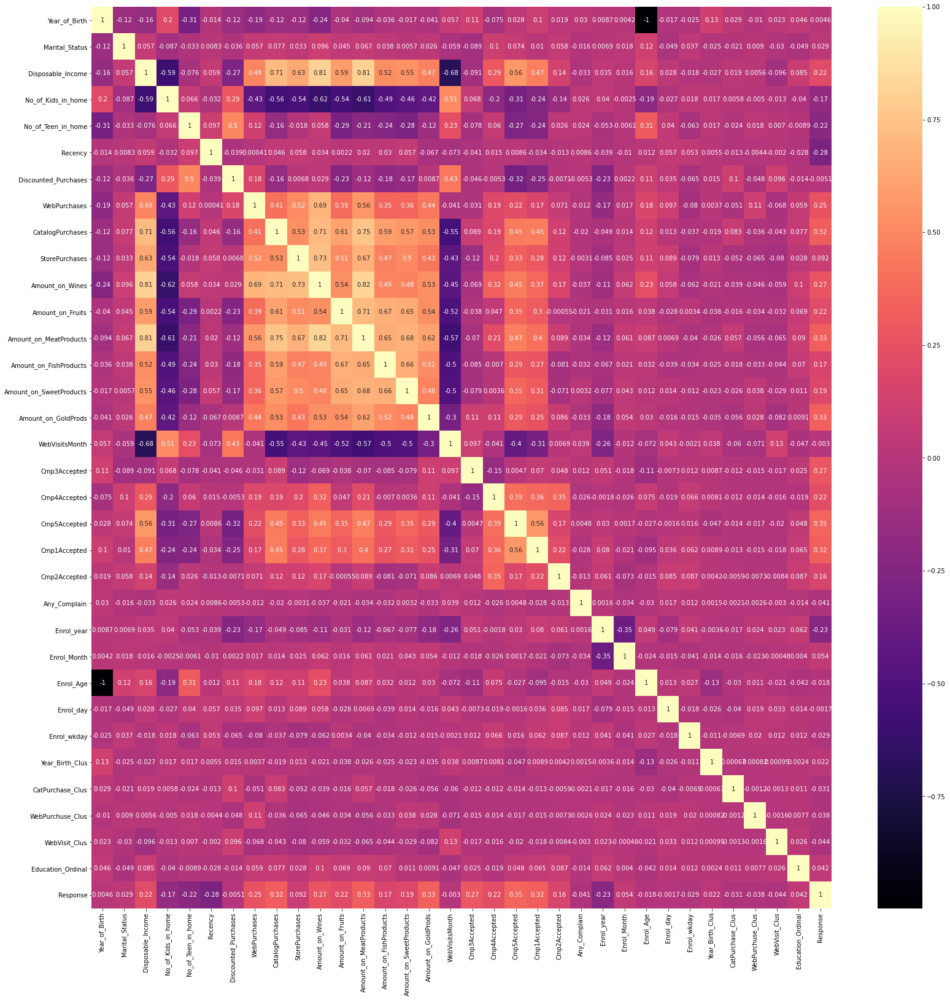

In [198]:
plt.figure(figsize = (27,27))
sns.heatmap(new.corr(),annot = True,cbar=True, cmap='magma')

In [197]:
abs(new.corr().loc['Response',:].sort_values(ascending=False))

Response                   1.000000
Cmp5Accepted               0.348437
Amount_on_GoldProds        0.330274
Amount_on_MeatProducts     0.328507
Cmp1Accepted               0.323545
CatalogPurchases           0.317939
Cmp3Accepted               0.274198
Amount_on_Wines            0.272644
WebPurchases               0.250713
Cmp4Accepted               0.221809
Disposable_Income          0.219231
Amount_on_Fruits           0.215775
Amount_on_SweetProducts    0.189123
Amount_on_FishProducts     0.166418
Cmp2Accepted               0.157537
StorePurchases             0.092212
Enrol_Month                0.054250
Education_Ordinal          0.042473
Marital_Status             0.028989
Year_Birth_Clus            0.021755
Year_of_Birth              0.004558
Enrol_day                  0.001701
WebVisitsMonth             0.002978
Discounted_Purchases       0.005107
Enrol_Age                  0.017900
Enrol_wkday                0.029114
CatPurchase_Clus           0.030773
WebPurchuse_Clus           0

## Building Machine Learning models

In [142]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score,accuracy_score,confusion_matrix
from sklearn.model_selection import KFold, cross_val_score

In [143]:
def cross_validate(model, nfolds, feat, targets):
    score = (cross_val_score(model, feat, targets, cv=nfolds, 
                                  scoring = 'accuracy'))
    return score

## Random Forest Algorithm

In [144]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(criterion= 'gini', max_depth=40, max_features= 1, n_estimators= 150)
print("accuracy", cross_validate(rf_model, 10, X, y_train_res))

accuracy [0.95754717 0.94339623 0.95754717 0.94811321 0.9478673  0.95260664
 0.97156398 0.97156398 0.9478673  0.96208531]


In [145]:
from sklearn.ensemble import RandomForestClassifier

rf =  RandomForestClassifier(criterion= 'gini', max_depth=40, max_features= 1, n_estimators= 175)

rf.fit(X,y_train_res)


pred = rf.predict(test)
pred2 = rf.predict(X)

print('Training set')
print('rf classifier f1_score {}'.format(f1_score(y_train_res,pred2)))
print('Testing set')
print('rf classifier f1_score {}'.format(f1_score(y_test,pred)))

Training set
rf classifier f1_score 0.9971698113207548
Testing set
rf classifier f1_score 0.4888888888888889


In [146]:
submission_file = pd.read_csv('SampleSubmission.csv')

In [147]:
f4_entry = submission_file.copy()
f4_entry.Response = rf.predict(testing)
f4_entry.to_csv('f4_entry.csv',index=False)

## Xtreme Boost Algorithm

In [148]:
import xgboost as xgb

xgb_model = xgb.XGBClassifier(n_estimators = 150)
print('Accuracy:', cross_validate(xgb_model,10,X,y_train_res))

[19:16:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:16:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:16:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:16:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

In [153]:
xgb_model = xgb.XGBClassifier(n_estimators = 200)

xgb_model.fit(X,y_train_res)


pred = xgb_model.predict(test)
pred2 = xgb_model.predict(X)

print('Training set')
print('xgb_model classifier f1_score {}'.format(f1_score(y_train_res,pred2)))
print('Testing set')
print('xgb_model classifier f1_score {}'.format(f1_score(y_test,pred)))

[19:18:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training set
xgb_model classifier f1_score 0.9962299717247879
Testing set
xgb_model classifier f1_score 0.4489795918367347


In [154]:
f5_entry = submission_file.copy()
f5_entry.Response = xgb_model.predict(testing)
f5_entry.to_csv('f5_entry.csv',index=False)

## Lightgbm Algorithm

In [155]:
import lightgbm as lgb

lgb_model = lgb.LGBMClassifier(n_estimators=100)
print('Accuracy:', cross_validate(lgb_model,10,X,y_train_res))

Accuracy: [0.89150943 0.93396226 0.96698113 0.94811321 0.9478673  0.91943128
 0.94312796 0.93364929 0.90995261 0.90521327]


In [182]:
lgb_model = lgb.LGBMClassifier(n_estimators = 170)

lgb_model.fit(X,y_train_res)


pred = lgb_model.predict(test)
pred2 = lgb_model.predict(X)
print('Training set')
print('lgb_model classifier f1_score {}'.format(f1_score(y_train_res,pred2)))
print('Testing set')
print('lgb_model classifier f1_score {}'.format(f1_score(y_test,pred)))

Training set
lgb_model classifier f1_score 0.9938881053126468
Testing set
lgb_model classifier f1_score 0.5106382978723405


In [166]:
f10_entry = submission_file.copy()
f10_entry.Response = lgb_model.predict(testing)
f10_entry.to_csv('f10_entry.csv',index=False)

## CatBoost Algorithm

In [119]:
from catboost import CatBoostClassifier

cat_model = CatBoostClassifier(iterations=200,learning_rate=0.1,depth=4)
print("Accuracy:", cross_validate(cat_model, 10, X, y_train_res))

0:	learn: 0.6588282	total: 310ms	remaining: 1m 1s
1:	learn: 0.6245914	total: 317ms	remaining: 31.4s
2:	learn: 0.5944079	total: 325ms	remaining: 21.3s
3:	learn: 0.5715071	total: 332ms	remaining: 16.3s
4:	learn: 0.5518183	total: 339ms	remaining: 13.2s
5:	learn: 0.5375625	total: 347ms	remaining: 11.2s
6:	learn: 0.5190695	total: 355ms	remaining: 9.79s
7:	learn: 0.5059046	total: 363ms	remaining: 8.7s
8:	learn: 0.4946460	total: 372ms	remaining: 7.89s
9:	learn: 0.4814018	total: 379ms	remaining: 7.2s
10:	learn: 0.4663412	total: 386ms	remaining: 6.62s
11:	learn: 0.4549638	total: 392ms	remaining: 6.14s
12:	learn: 0.4447725	total: 399ms	remaining: 5.74s
13:	learn: 0.4354140	total: 405ms	remaining: 5.38s
14:	learn: 0.4296616	total: 411ms	remaining: 5.07s
15:	learn: 0.4241063	total: 418ms	remaining: 4.8s
16:	learn: 0.4185844	total: 425ms	remaining: 4.57s
17:	learn: 0.4115170	total: 431ms	remaining: 4.36s
18:	learn: 0.4040594	total: 438ms	remaining: 4.17s
19:	learn: 0.3998072	total: 445ms	remaining:

165:	learn: 0.1116166	total: 1.61s	remaining: 330ms
166:	learn: 0.1106326	total: 1.62s	remaining: 321ms
167:	learn: 0.1098289	total: 1.63s	remaining: 310ms
168:	learn: 0.1094520	total: 1.64s	remaining: 300ms
169:	learn: 0.1086333	total: 1.65s	remaining: 290ms
170:	learn: 0.1082185	total: 1.65s	remaining: 280ms
171:	learn: 0.1072296	total: 1.66s	remaining: 270ms
172:	learn: 0.1063680	total: 1.67s	remaining: 260ms
173:	learn: 0.1050282	total: 1.68s	remaining: 251ms
174:	learn: 0.1040911	total: 1.69s	remaining: 241ms
175:	learn: 0.1035190	total: 1.69s	remaining: 231ms
176:	learn: 0.1026996	total: 1.7s	remaining: 221ms
177:	learn: 0.1017899	total: 1.71s	remaining: 211ms
178:	learn: 0.1012432	total: 1.71s	remaining: 201ms
179:	learn: 0.1003871	total: 1.72s	remaining: 191ms
180:	learn: 0.0994334	total: 1.73s	remaining: 181ms
181:	learn: 0.0986637	total: 1.74s	remaining: 172ms
182:	learn: 0.0979403	total: 1.74s	remaining: 162ms
183:	learn: 0.0973097	total: 1.75s	remaining: 152ms
184:	learn: 0

132:	learn: 0.1371885	total: 979ms	remaining: 493ms
133:	learn: 0.1364600	total: 987ms	remaining: 486ms
134:	learn: 0.1349891	total: 995ms	remaining: 479ms
135:	learn: 0.1341829	total: 1s	remaining: 472ms
136:	learn: 0.1333339	total: 1.01s	remaining: 464ms
137:	learn: 0.1318412	total: 1.02s	remaining: 457ms
138:	learn: 0.1307283	total: 1.02s	remaining: 450ms
139:	learn: 0.1292698	total: 1.03s	remaining: 442ms
140:	learn: 0.1286183	total: 1.04s	remaining: 435ms
141:	learn: 0.1270930	total: 1.05s	remaining: 428ms
142:	learn: 0.1261285	total: 1.05s	remaining: 420ms
143:	learn: 0.1252570	total: 1.06s	remaining: 413ms
144:	learn: 0.1244675	total: 1.07s	remaining: 405ms
145:	learn: 0.1234120	total: 1.07s	remaining: 397ms
146:	learn: 0.1226533	total: 1.08s	remaining: 390ms
147:	learn: 0.1214828	total: 1.09s	remaining: 383ms
148:	learn: 0.1206958	total: 1.09s	remaining: 375ms
149:	learn: 0.1200604	total: 1.1s	remaining: 367ms
150:	learn: 0.1192250	total: 1.11s	remaining: 361ms
151:	learn: 0.11

111:	learn: 0.1668567	total: 835ms	remaining: 656ms
112:	learn: 0.1656937	total: 842ms	remaining: 648ms
113:	learn: 0.1637729	total: 850ms	remaining: 641ms
114:	learn: 0.1621189	total: 858ms	remaining: 634ms
115:	learn: 0.1602372	total: 866ms	remaining: 627ms
116:	learn: 0.1586513	total: 873ms	remaining: 620ms
117:	learn: 0.1568850	total: 881ms	remaining: 612ms
118:	learn: 0.1552867	total: 889ms	remaining: 605ms
119:	learn: 0.1540761	total: 896ms	remaining: 598ms
120:	learn: 0.1527932	total: 905ms	remaining: 591ms
121:	learn: 0.1514935	total: 912ms	remaining: 583ms
122:	learn: 0.1498375	total: 919ms	remaining: 575ms
123:	learn: 0.1483293	total: 927ms	remaining: 568ms
124:	learn: 0.1472236	total: 935ms	remaining: 561ms
125:	learn: 0.1463246	total: 942ms	remaining: 553ms
126:	learn: 0.1457292	total: 951ms	remaining: 546ms
127:	learn: 0.1444497	total: 958ms	remaining: 539ms
128:	learn: 0.1427524	total: 966ms	remaining: 531ms
129:	learn: 0.1418330	total: 973ms	remaining: 524ms
130:	learn: 

90:	learn: 0.2044024	total: 677ms	remaining: 811ms
91:	learn: 0.2024655	total: 687ms	remaining: 807ms
92:	learn: 0.2010348	total: 697ms	remaining: 802ms
93:	learn: 0.1989385	total: 708ms	remaining: 798ms
94:	learn: 0.1965717	total: 718ms	remaining: 794ms
95:	learn: 0.1946058	total: 728ms	remaining: 788ms
96:	learn: 0.1926876	total: 738ms	remaining: 784ms
97:	learn: 0.1914397	total: 748ms	remaining: 778ms
98:	learn: 0.1890225	total: 755ms	remaining: 770ms
99:	learn: 0.1874475	total: 763ms	remaining: 763ms
100:	learn: 0.1863107	total: 771ms	remaining: 755ms
101:	learn: 0.1843203	total: 778ms	remaining: 748ms
102:	learn: 0.1826469	total: 786ms	remaining: 740ms
103:	learn: 0.1809345	total: 794ms	remaining: 733ms
104:	learn: 0.1793529	total: 801ms	remaining: 725ms
105:	learn: 0.1775458	total: 808ms	remaining: 717ms
106:	learn: 0.1760904	total: 815ms	remaining: 709ms
107:	learn: 0.1756869	total: 822ms	remaining: 700ms
108:	learn: 0.1748557	total: 829ms	remaining: 692ms
109:	learn: 0.1737273	

69:	learn: 0.2517851	total: 511ms	remaining: 950ms
70:	learn: 0.2498665	total: 521ms	remaining: 946ms
71:	learn: 0.2479808	total: 528ms	remaining: 939ms
72:	learn: 0.2457937	total: 539ms	remaining: 938ms
73:	learn: 0.2439568	total: 546ms	remaining: 931ms
74:	learn: 0.2418127	total: 557ms	remaining: 928ms
75:	learn: 0.2406914	total: 565ms	remaining: 921ms
76:	learn: 0.2384066	total: 573ms	remaining: 915ms
77:	learn: 0.2358456	total: 583ms	remaining: 912ms
78:	learn: 0.2344016	total: 590ms	remaining: 903ms
79:	learn: 0.2325926	total: 598ms	remaining: 896ms
80:	learn: 0.2306871	total: 605ms	remaining: 888ms
81:	learn: 0.2285145	total: 611ms	remaining: 880ms
82:	learn: 0.2263513	total: 618ms	remaining: 871ms
83:	learn: 0.2237128	total: 625ms	remaining: 863ms
84:	learn: 0.2218334	total: 632ms	remaining: 855ms
85:	learn: 0.2200766	total: 639ms	remaining: 847ms
86:	learn: 0.2180021	total: 646ms	remaining: 839ms
87:	learn: 0.2160005	total: 653ms	remaining: 831ms
88:	learn: 0.2142182	total: 659

48:	learn: 0.2998204	total: 340ms	remaining: 1.05s
49:	learn: 0.2973783	total: 348ms	remaining: 1.04s
50:	learn: 0.2938157	total: 356ms	remaining: 1.04s
51:	learn: 0.2920765	total: 363ms	remaining: 1.03s
52:	learn: 0.2898267	total: 371ms	remaining: 1.03s
53:	learn: 0.2874149	total: 379ms	remaining: 1.02s
54:	learn: 0.2854186	total: 387ms	remaining: 1.02s
55:	learn: 0.2826886	total: 394ms	remaining: 1.01s
56:	learn: 0.2801853	total: 401ms	remaining: 1s
57:	learn: 0.2791365	total: 410ms	remaining: 1s
58:	learn: 0.2766826	total: 417ms	remaining: 997ms
59:	learn: 0.2754819	total: 425ms	remaining: 991ms
60:	learn: 0.2732743	total: 432ms	remaining: 983ms
61:	learn: 0.2713764	total: 439ms	remaining: 976ms
62:	learn: 0.2693806	total: 445ms	remaining: 969ms
63:	learn: 0.2668201	total: 452ms	remaining: 961ms
64:	learn: 0.2648702	total: 459ms	remaining: 953ms
65:	learn: 0.2629266	total: 466ms	remaining: 946ms
66:	learn: 0.2601454	total: 473ms	remaining: 938ms
67:	learn: 0.2590107	total: 479ms	rem

22:	learn: 0.4016470	total: 175ms	remaining: 1.35s
23:	learn: 0.3952663	total: 183ms	remaining: 1.34s
24:	learn: 0.3882549	total: 194ms	remaining: 1.35s
25:	learn: 0.3846708	total: 204ms	remaining: 1.36s
26:	learn: 0.3779073	total: 214ms	remaining: 1.37s
27:	learn: 0.3751860	total: 225ms	remaining: 1.38s
28:	learn: 0.3715321	total: 234ms	remaining: 1.38s
29:	learn: 0.3680815	total: 244ms	remaining: 1.38s
30:	learn: 0.3632691	total: 253ms	remaining: 1.38s
31:	learn: 0.3597660	total: 260ms	remaining: 1.37s
32:	learn: 0.3571043	total: 268ms	remaining: 1.36s
33:	learn: 0.3548782	total: 276ms	remaining: 1.35s
34:	learn: 0.3513631	total: 284ms	remaining: 1.34s
35:	learn: 0.3470247	total: 292ms	remaining: 1.33s
36:	learn: 0.3437895	total: 301ms	remaining: 1.32s
37:	learn: 0.3399132	total: 308ms	remaining: 1.31s
38:	learn: 0.3367852	total: 316ms	remaining: 1.3s
39:	learn: 0.3328045	total: 323ms	remaining: 1.29s
40:	learn: 0.3307202	total: 330ms	remaining: 1.28s
41:	learn: 0.3265483	total: 339m

194:	learn: 0.0907372	total: 1.67s	remaining: 42.8ms
195:	learn: 0.0904057	total: 1.67s	remaining: 34.2ms
196:	learn: 0.0900455	total: 1.68s	remaining: 25.6ms
197:	learn: 0.0895799	total: 1.69s	remaining: 17.1ms
198:	learn: 0.0892501	total: 1.7s	remaining: 8.54ms
199:	learn: 0.0886140	total: 1.71s	remaining: 0us
0:	learn: 0.6576324	total: 7.1ms	remaining: 1.41s
1:	learn: 0.6226161	total: 13.8ms	remaining: 1.36s
2:	learn: 0.5927363	total: 20.4ms	remaining: 1.34s
3:	learn: 0.5695135	total: 27.2ms	remaining: 1.33s
4:	learn: 0.5510772	total: 34.3ms	remaining: 1.34s
5:	learn: 0.5338854	total: 40.8ms	remaining: 1.32s
6:	learn: 0.5169176	total: 47.3ms	remaining: 1.3s
7:	learn: 0.5027542	total: 53.5ms	remaining: 1.28s
8:	learn: 0.4926940	total: 60.2ms	remaining: 1.28s
9:	learn: 0.4794770	total: 67ms	remaining: 1.27s
10:	learn: 0.4654028	total: 73.9ms	remaining: 1.27s
11:	learn: 0.4551860	total: 80.4ms	remaining: 1.26s
12:	learn: 0.4439781	total: 87.3ms	remaining: 1.25s
13:	learn: 0.4341936	tot

155:	learn: 0.1162255	total: 1.15s	remaining: 324ms
156:	learn: 0.1158011	total: 1.16s	remaining: 317ms
157:	learn: 0.1150612	total: 1.16s	remaining: 310ms
158:	learn: 0.1141815	total: 1.17s	remaining: 302ms
159:	learn: 0.1129961	total: 1.18s	remaining: 295ms
160:	learn: 0.1124444	total: 1.19s	remaining: 288ms
161:	learn: 0.1113020	total: 1.19s	remaining: 280ms
162:	learn: 0.1102406	total: 1.2s	remaining: 273ms
163:	learn: 0.1096313	total: 1.21s	remaining: 265ms
164:	learn: 0.1088231	total: 1.21s	remaining: 257ms
165:	learn: 0.1078371	total: 1.22s	remaining: 250ms
166:	learn: 0.1073569	total: 1.23s	remaining: 243ms
167:	learn: 0.1060994	total: 1.23s	remaining: 235ms
168:	learn: 0.1049505	total: 1.24s	remaining: 228ms
169:	learn: 0.1041015	total: 1.25s	remaining: 220ms
170:	learn: 0.1039070	total: 1.25s	remaining: 213ms
171:	learn: 0.1031036	total: 1.26s	remaining: 206ms
172:	learn: 0.1024605	total: 1.27s	remaining: 198ms
173:	learn: 0.1014151	total: 1.28s	remaining: 191ms
174:	learn: 0

132:	learn: 0.1400849	total: 1.02s	remaining: 513ms
133:	learn: 0.1390041	total: 1.03s	remaining: 506ms
134:	learn: 0.1377566	total: 1.03s	remaining: 498ms
135:	learn: 0.1365150	total: 1.04s	remaining: 490ms
136:	learn: 0.1346755	total: 1.05s	remaining: 482ms
137:	learn: 0.1333775	total: 1.06s	remaining: 474ms
138:	learn: 0.1322554	total: 1.06s	remaining: 466ms
139:	learn: 0.1312319	total: 1.07s	remaining: 459ms
140:	learn: 0.1302153	total: 1.08s	remaining: 451ms
141:	learn: 0.1286749	total: 1.09s	remaining: 444ms
142:	learn: 0.1279787	total: 1.09s	remaining: 436ms
143:	learn: 0.1268006	total: 1.1s	remaining: 429ms
144:	learn: 0.1258337	total: 1.11s	remaining: 421ms
145:	learn: 0.1252874	total: 1.11s	remaining: 413ms
146:	learn: 0.1242248	total: 1.12s	remaining: 405ms
147:	learn: 0.1233055	total: 1.13s	remaining: 397ms
148:	learn: 0.1225809	total: 1.14s	remaining: 389ms
149:	learn: 0.1215247	total: 1.14s	remaining: 381ms
150:	learn: 0.1205966	total: 1.15s	remaining: 373ms
151:	learn: 0

107:	learn: 0.1801916	total: 820ms	remaining: 699ms
108:	learn: 0.1790756	total: 827ms	remaining: 690ms
109:	learn: 0.1777406	total: 834ms	remaining: 682ms
110:	learn: 0.1760674	total: 842ms	remaining: 675ms
111:	learn: 0.1748904	total: 849ms	remaining: 667ms
112:	learn: 0.1724969	total: 857ms	remaining: 659ms
113:	learn: 0.1715956	total: 864ms	remaining: 652ms
114:	learn: 0.1699319	total: 871ms	remaining: 644ms
115:	learn: 0.1680212	total: 878ms	remaining: 636ms
116:	learn: 0.1668136	total: 886ms	remaining: 628ms
117:	learn: 0.1654107	total: 893ms	remaining: 620ms
118:	learn: 0.1637146	total: 899ms	remaining: 612ms
119:	learn: 0.1624549	total: 906ms	remaining: 604ms
120:	learn: 0.1607544	total: 913ms	remaining: 596ms
121:	learn: 0.1589661	total: 919ms	remaining: 588ms
122:	learn: 0.1579789	total: 926ms	remaining: 580ms
123:	learn: 0.1564941	total: 934ms	remaining: 572ms
124:	learn: 0.1549686	total: 940ms	remaining: 564ms
125:	learn: 0.1533854	total: 947ms	remaining: 556ms
126:	learn: 

In [120]:
cat_model.fit(X,y_train_res)
pred = cat_model.predict(test)
pred2 = cat_model.predict(X)
print('Training set')
print('cat_model classifier f1_score {}'.format(f1_score(y_train_res,pred2)))
print('Testing set')
print('cat_model classifier f1_score {}'.format(f1_score(y_test,pred)))

0:	learn: 0.6573890	total: 8.62ms	remaining: 1.72s
1:	learn: 0.6182322	total: 15.5ms	remaining: 1.54s
2:	learn: 0.5887849	total: 24.2ms	remaining: 1.59s
3:	learn: 0.5674735	total: 32.3ms	remaining: 1.58s
4:	learn: 0.5486657	total: 40.1ms	remaining: 1.56s
5:	learn: 0.5304097	total: 47ms	remaining: 1.52s
6:	learn: 0.5116485	total: 54ms	remaining: 1.49s
7:	learn: 0.4962643	total: 61.4ms	remaining: 1.47s
8:	learn: 0.4865392	total: 68.2ms	remaining: 1.45s
9:	learn: 0.4783357	total: 74.9ms	remaining: 1.42s
10:	learn: 0.4686693	total: 82.2ms	remaining: 1.41s
11:	learn: 0.4556612	total: 89ms	remaining: 1.39s
12:	learn: 0.4484130	total: 96.1ms	remaining: 1.38s
13:	learn: 0.4403540	total: 103ms	remaining: 1.37s
14:	learn: 0.4339279	total: 110ms	remaining: 1.36s
15:	learn: 0.4281444	total: 117ms	remaining: 1.34s
16:	learn: 0.4218349	total: 125ms	remaining: 1.34s
17:	learn: 0.4148839	total: 131ms	remaining: 1.33s
18:	learn: 0.4098970	total: 138ms	remaining: 1.31s
19:	learn: 0.4043771	total: 145ms	

175:	learn: 0.1080086	total: 1.5s	remaining: 204ms
176:	learn: 0.1073253	total: 1.5s	remaining: 195ms
177:	learn: 0.1063485	total: 1.51s	remaining: 187ms
178:	learn: 0.1052903	total: 1.52s	remaining: 178ms
179:	learn: 0.1044796	total: 1.52s	remaining: 170ms
180:	learn: 0.1038503	total: 1.53s	remaining: 161ms
181:	learn: 0.1030596	total: 1.54s	remaining: 152ms
182:	learn: 0.1023525	total: 1.55s	remaining: 144ms
183:	learn: 0.1019007	total: 1.56s	remaining: 135ms
184:	learn: 0.1016523	total: 1.56s	remaining: 127ms
185:	learn: 0.1010545	total: 1.57s	remaining: 118ms
186:	learn: 0.1001678	total: 1.58s	remaining: 110ms
187:	learn: 0.0990397	total: 1.59s	remaining: 101ms
188:	learn: 0.0983428	total: 1.59s	remaining: 92.9ms
189:	learn: 0.0975871	total: 1.6s	remaining: 84.3ms
190:	learn: 0.0968852	total: 1.61s	remaining: 75.9ms
191:	learn: 0.0961707	total: 1.62s	remaining: 67.4ms
192:	learn: 0.0954360	total: 1.63s	remaining: 59ms
193:	learn: 0.0948930	total: 1.63s	remaining: 50.5ms
194:	learn:

## GradientBoosting Algorithm

In [121]:
from sklearn.ensemble import GradientBoostingClassifier

gbmodel = GradientBoostingClassifier(n_estimators= 100)
print("Accuracy:", cross_validate(gbmodel, 10, X, y_train_res))

Accuracy: [0.91981132 0.9245283  0.93867925 0.91981132 0.92890995 0.91469194
 0.94312796 0.92417062 0.92417062 0.92890995]


In [136]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(loss = 'exponential', criterion='squared_error', n_estimators= 330)

gb.fit(X,y_train_res)

pred = gb.predict(test)
pred2 = gb.predict(X)
print('Training set')
print('et_model classifier f1_score {}'.format(f1_score(y_train_res,pred2)))
print('Testing set')
print('et_model classifier f1_score {}'.format(f1_score(y_test,pred)))

Training set
et_model classifier f1_score 0.9966996699669968
Testing set
et_model classifier f1_score 0.5609756097560975


In [137]:
f6_entry = submission_file.copy()
f6_entry.Response = gb.predict(testing)
f6_entry.to_csv('f6_entry.csv',index=False)

## Decision Tree Algorithm

In [168]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier()
print("accuracy", cross_validate(dt_model, 10, X, y_train_res))

accuracy [0.91981132 0.91509434 0.94339623 0.92924528 0.9478673  0.95734597
 0.97630332 0.96208531 0.91469194 0.95734597]


In [166]:
dt_model =  DecisionTreeClassifier()

dt_model.fit(X,y_train_res)


pred = dt_model.predict(test)
pred2 = dt_model.predict(X)

print('Training set')
print('dt_model classifier f1_score {}'.format(f1_score(y_train_res,pred2)))
print('Testing set')
print('dt_model classifier f1_score {}'.format(f1_score(y_test,pred)))

Training set
dt_model classifier f1_score 0.997638167217761
Testing set
dt_model classifier f1_score 0.4819277108433735


## AdaBoost Classifier Algorithm

In [184]:
from sklearn.ensemble import AdaBoostClassifier

ada_model = AdaBoostClassifier( n_estimators=150)
print("Accuracy", cross_validate(ada_model, 10, X, y_train_res)) 

Accuracy [0.93867925 0.89622642 0.91037736 0.88679245 0.91469194 0.8957346
 0.90995261 0.93838863 0.90995261 0.9478673 ]


In [197]:
ag = AdaBoostClassifier(n_estimators=300)

ag.fit(X,y_train_res)


pred = ag.predict(test)
pred2 = ag.predict(X)

print('Training set')
print('et_model classifier f1_score {}'.format(f1_score(y_train_res,pred2)))
print('Testing set')
print('et_model classifier f1_score {}'.format(f1_score(y_test,pred)))

Training set
et_model classifier f1_score 0.9628942486085342
Testing set
et_model classifier f1_score 0.5681818181818181


In [198]:
f9_entry = submission_file.copy()
f9_entry.Response = ag.predict(testing)
f9_entry.to_csv('f9_entry.csv',index=False)